### Imports

In [63]:
import kagglehub
import os
import glob

import cv2
import matplotlib.pyplot as plt

import numpy as np
import skfuzzy as fuzz

### Load data

In [ ]:

path = kagglehub.dataset_download("mateuszbuda/lgg-mri-segmentation", output_dir="./data")

all_images = glob.glob(os.path.join(path, "**/*.tif"), recursive=True)


100%|██████████| 714M/714M [01:08<00:00, 10.9MB/s] 

Extracting files...


In [10]:
all_images

['./data\\kaggle_3m\\TCGA_CS_4941_19960909\\TCGA_CS_4941_19960909_1.tif',
 './data\\kaggle_3m\\TCGA_CS_4941_19960909\\TCGA_CS_4941_19960909_10.tif',
 './data\\kaggle_3m\\TCGA_CS_4941_19960909\\TCGA_CS_4941_19960909_10_mask.tif',
 './data\\kaggle_3m\\TCGA_CS_4941_19960909\\TCGA_CS_4941_19960909_11.tif',
 './data\\kaggle_3m\\TCGA_CS_4941_19960909\\TCGA_CS_4941_19960909_11_mask.tif',
 './data\\kaggle_3m\\TCGA_CS_4941_19960909\\TCGA_CS_4941_19960909_12.tif',
 './data\\kaggle_3m\\TCGA_CS_4941_19960909\\TCGA_CS_4941_19960909_12_mask.tif',
 './data\\kaggle_3m\\TCGA_CS_4941_19960909\\TCGA_CS_4941_19960909_13.tif',
 './data\\kaggle_3m\\TCGA_CS_4941_19960909\\TCGA_CS_4941_19960909_13_mask.tif',
 './data\\kaggle_3m\\TCGA_CS_4941_19960909\\TCGA_CS_4941_19960909_14.tif',
 './data\\kaggle_3m\\TCGA_CS_4941_19960909\\TCGA_CS_4941_19960909_14_mask.tif',
 './data\\kaggle_3m\\TCGA_CS_4941_19960909\\TCGA_CS_4941_19960909_15.tif',
 './data\\kaggle_3m\\TCGA_CS_4941_19960909\\TCGA_CS_4941_19960909_15_mask.ti

In [11]:
image_files = [img for img in all_images if "mask" not in img]
image_files

['./data\\kaggle_3m\\TCGA_CS_4941_19960909\\TCGA_CS_4941_19960909_1.tif',
 './data\\kaggle_3m\\TCGA_CS_4941_19960909\\TCGA_CS_4941_19960909_10.tif',
 './data\\kaggle_3m\\TCGA_CS_4941_19960909\\TCGA_CS_4941_19960909_11.tif',
 './data\\kaggle_3m\\TCGA_CS_4941_19960909\\TCGA_CS_4941_19960909_12.tif',
 './data\\kaggle_3m\\TCGA_CS_4941_19960909\\TCGA_CS_4941_19960909_13.tif',
 './data\\kaggle_3m\\TCGA_CS_4941_19960909\\TCGA_CS_4941_19960909_14.tif',
 './data\\kaggle_3m\\TCGA_CS_4941_19960909\\TCGA_CS_4941_19960909_15.tif',
 './data\\kaggle_3m\\TCGA_CS_4941_19960909\\TCGA_CS_4941_19960909_16.tif',
 './data\\kaggle_3m\\TCGA_CS_4941_19960909\\TCGA_CS_4941_19960909_17.tif',
 './data\\kaggle_3m\\TCGA_CS_4941_19960909\\TCGA_CS_4941_19960909_18.tif',
 './data\\kaggle_3m\\TCGA_CS_4941_19960909\\TCGA_CS_4941_19960909_19.tif',
 './data\\kaggle_3m\\TCGA_CS_4941_19960909\\TCGA_CS_4941_19960909_2.tif',
 './data\\kaggle_3m\\TCGA_CS_4941_19960909\\TCGA_CS_4941_19960909_20.tif',
 './data\\kaggle_3m\\TCGA_C

In [12]:
image_mask_pairs = [(img_file, img_file.replace(".tif", "_mask.tif")) for img_file in image_files]

image_mask_pairs[0]

('./data\\kaggle_3m\\TCGA_CS_4941_19960909\\TCGA_CS_4941_19960909_1.tif',
 './data\\kaggle_3m\\TCGA_CS_4941_19960909\\TCGA_CS_4941_19960909_1_mask.tif')

### Visualisation of the MRI image with mask

In [33]:

def visualize_mri_and_mask(image_pair):
    image_path = image_pair[0]
    mask_path = image_pair[1]
    
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.imshow(img, cmap="gray")
    plt.title("Original MRI Slice")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(mask, cmap='gray')
    plt.title("Ground Truth (Expert Mask)")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

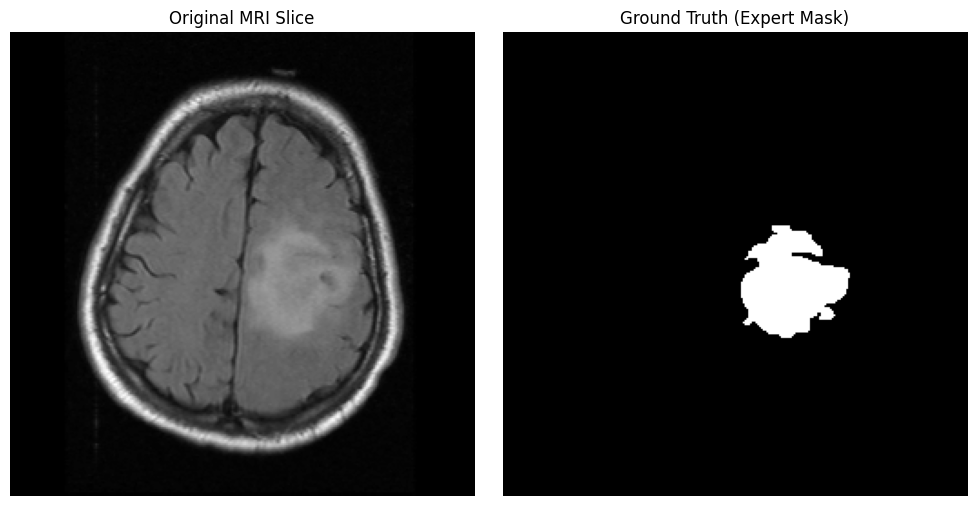

In [61]:
visualize_mri_and_mask(image_mask_pairs[49])

### Experiments

In [ ]:


def run_fcm_segmentation(preprocessed_img, n_clusters=4, fuzzifier=2):
    data = preprocessed_img.flatten().reshape(1, -1).astype(float)    
    # Execute FCM
    cntr, u, u0, d, jm, p, fpc = fuzz.cluster.cmeans(
        data, c=n_clusters, m=fuzzifier, error=0.005, maxiter=1000)

    tumor_cluster_idx = np.argmax(cntr)
    fuzzy_tumor_membership = u[tumor_cluster_idx].reshape(preprocessed_img.shape)

    return fuzzy_tumor_membership, fpc, cntr, u

[[1.09125346e-03 1.09125346e-03 1.09125346e-03 ... 1.09125346e-03
  1.09125346e-03 1.09125346e-03]
 [1.09125346e-03 1.09125346e-03 1.09125346e-03 ... 1.09125346e-03
  1.09125346e-03 1.09125346e-03]
 [1.09125346e-03 1.09125346e-03 1.09125346e-03 ... 1.09125346e-03
  1.09125346e-03 1.09125346e-03]
 ...
 [1.06949259e-04 1.06949259e-04 5.86278717e-05 ... 1.95321807e-05
  1.95321807e-05 1.95321807e-05]
 [1.06949259e-04 1.06949259e-04 1.06949259e-04 ... 1.95321807e-05
  1.95321807e-05 4.79622845e-04]
 [1.06949259e-04 1.06949259e-04 1.06949259e-04 ... 4.79622845e-04
  4.79622845e-04 4.79622845e-04]]
Processed: ./data\kaggle_3m\TCGA_CS_4941_19960909\TCGA_CS_4941_19960909_1.tif | Quality (FPC): 0.8218
[[0.00047079 0.00047079 0.00140968 ... 0.00140968 0.00140968 0.00140968]
 [0.00047079 0.00047079 0.00140968 ... 0.00140968 0.00140968 0.00140968]
 [0.00047079 0.00047079 0.00140968 ... 0.00140968 0.00140968 0.00047079]
 ...
 [0.0010463  0.0010463  0.0010463  ... 0.00011513 0.00011513 0.00011513]
 

KeyboardInterrupt: 

In [ ]:

def plot_membership_functions(preprocessed_img, u_matrix, centroids, quality_fpc):
    intensities = preprocessed_img.flatten()
    
    sort_idx = np.argsort(intensities)
    sorted_intensities = intensities[sort_idx]
    
    order = np.argsort(centroids.flatten())
    labels = ["Background", "Healthy Tissue", "Edema/Transition", "Tumor"]
    colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']

    plt.figure(figsize=(10, 6))
    
    for i, cluster_idx in enumerate(order):
        sorted_membership = u_matrix[cluster_idx][sort_idx]
        
        plt.plot(sorted_intensities, sorted_membership, 
                 label=labels[i], color=colors[i], linewidth=2)

    plt.title(f"Fuzzy Membership Functions (FPC: {quality_fpc:.4f})")
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Membership Degree (u_ij)")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.xlim(0, 255)
    plt.ylim(-0.05, 1.05)
    plt.show()



In [ ]:

def post_process_tumor(fuzzy_set, alpha=0.5):
    binary_mask = (fuzzy_set > alpha).astype(np.uint8)
    

    kernel = np.ones((5, 5), np.uint8)
    opening = cv2.morphologyEx(binary_mask, cv2.MORPH_OPEN, kernel)

    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(opening)
    
    cleaned_mask = np.zeros_like(opening)
    
    if num_labels > 1:
        largest_label = 1 + np.argmax(stats[1:, cv2.CC_STAT_AREA])
        
        cleaned_mask[labels == largest_label] = 1
        
    return cleaned_mask


In [ ]:
def remove_skull_by_component(binary_mask):
    kernel = np.ones((5,5), np.uint8)
    opening = cv2.morphologyEx(binary_mask, cv2.MORPH_OPEN, kernel)
    
    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(opening)
    
    if num_labels <= 1: 
        return np.zeros_like(binary_mask)
    
    areas = stats[1:, cv2.CC_STAT_AREA]
    max_label = np.argmax(areas) + 1
    
    cleaned_mask = np.zeros_like(opening)
    cleaned_mask[labels == max_label] = 1
    return cleaned_mask

In [ ]:


def visualize_comparison(original_img, fuzzy_set, ground_truth, alpha=0.5):

    
    final_mask = post_process_tumor(fuzzy_set)
    
    plt.figure(figsize=(15, 5))
    
    plt.subplot(1, 3, 1)
    plt.imshow(original_img, cmap='gray')
    plt.title("Original MRI")
    plt.axis('off')
    
    plt.subplot(1, 3, 2)
    plt.imshow(ground_truth, cmap='gray')
    plt.title("Ground Truth (Kaggle)")
    plt.axis('off')
    
    plt.subplot(1, 3, 3)
    plt.imshow(final_mask, cmap='gray')
    plt.title(f"FCM Result (α-cut = {alpha})")
    plt.axis('off')
    
    plt.show()

In [ ]:

def evaluate_metrics(final_mask, ground_truth):

    pred = (final_mask > 0).astype(np.uint8)
    gt = (ground_truth > 0).astype(np.uint8)
    
    intersection = np.sum(pred * gt)
    
    dice = (2. * intersection) / (np.sum(pred) + np.sum(gt) + 1e-6)
    
    return dice

In [ ]:
def get_all_clusters(preprocessed_img, u_matrix, centroids):
    cluster_indices = np.argmax(u_matrix, axis=0)
    
    full_segmentation = cluster_indices.reshape(preprocessed_img.shape)
    
    sorted_idx = np.argsort(centroids.flatten())
    
    final_segmented_all = np.zeros_like(full_segmentation)
    for new_label, old_label in enumerate(sorted_idx):
        final_segmented_all[full_segmentation == old_label] = new_label
        
    return final_segmented_all

In [ ]:
def plot_colored_segmentation(preprocessed_img, final_seg_map, centroids):
    
    sorted_idx = np.argsort(centroids.flatten())
    
    display_map = np.zeros_like(final_seg_map)
    for new_label, old_label in enumerate(sorted_idx):
        display_map[final_seg_map == old_label] = new_label

    from matplotlib.colors import ListedColormap
    colors = ['black', 'royalblue', 'limegreen', 'red']
    cmap_custom = ListedColormap(colors)

    plt.figure(figsize=(12, 6))
    
    plt.subplot(1, 2, 1)
    plt.imshow(preprocessed_img, cmap='gray')
    plt.title("Preprocessed MRI")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(display_map, cmap=cmap_custom)
    plt.title("4-Cluster Color Segmentation")
    plt.axis('off')
    
    plt.show()

In [ ]:

def filter_tumor_cluster(segmented_all, tumor_label=3):
    tumor_only = (segmented_all == tumor_label).astype(np.uint8)
    
    kernel = np.ones((7, 7), np.uint8) 
    cleaned = cv2.morphologyEx(tumor_only, cv2.MORPH_OPEN, kernel)
    
    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(cleaned)
    
    if num_labels <= 1:
        return np.zeros_like(segmented_all)
    
    # Get image center
    img_h, img_w = segmented_all.shape
    center_coords = np.array([img_w / 2, img_h / 2])
    
    min_dist = float('inf')
    best_label = -1
    
    for i in range(1, num_labels):
        area = stats[i, cv2.CC_STAT_AREA]
        
        if area < 50:
            continue
            
        blob_centroid = centroids[i]
        dist = np.linalg.norm(blob_centroid - center_coords)
        
        if dist < min_dist:
            min_dist = dist
            best_label = i
            
    final_tumor_mask = np.zeros_like(segmented_all)
    if best_label != -1:
        final_tumor_mask[labels == best_label] = 1
        
    return final_tumor_mask

In [ ]:

def test_filter_function(preprocessed_img, full_seg_map, tumor_label):

    raw_tumor = (full_seg_map == tumor_label).astype(np.uint8)
    
    cleaned_tumor = filter_tumor_cluster(full_seg_map, tumor_label=tumor_label)
    
    plt.figure(figsize=(18, 6))
    
    plt.subplot(1, 3, 1)
    plt.imshow(preprocessed_img, cmap='gray')
    plt.title("Original Preprocessed MRI")
    plt.axis('off')
    
    plt.subplot(1, 3, 2)
    plt.imshow(raw_tumor, cmap='Reds')
    plt.title("Raw Tumor Cluster\n(Includes High-Intensity Skull)")
    plt.axis('off')
    
    plt.subplot(1, 3, 3)
    plt.imshow(cleaned_tumor, cmap='Reds')
    plt.title("Filtered Tumor Result\n(Skull Removed via Blob Logic)")
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()


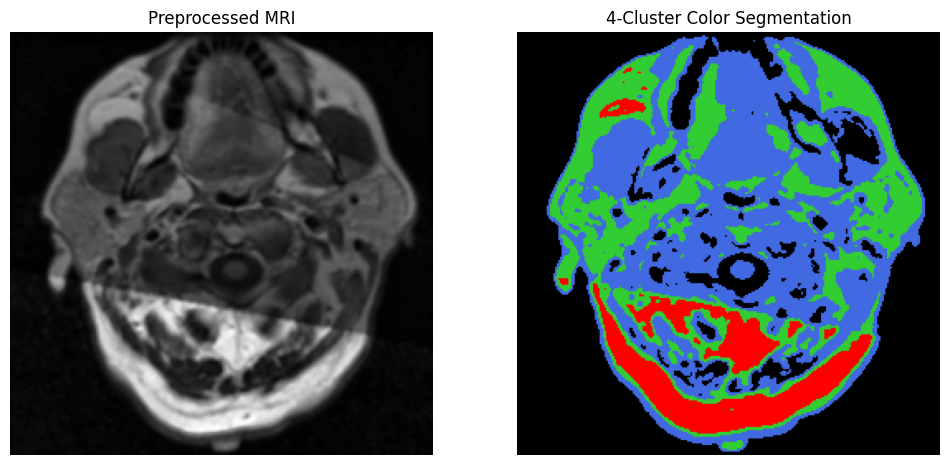

Processed: ./data\kaggle_3m\TCGA_CS_4941_19960909\TCGA_CS_4941_19960909_1.tif | Quality (FPC): 0.8218


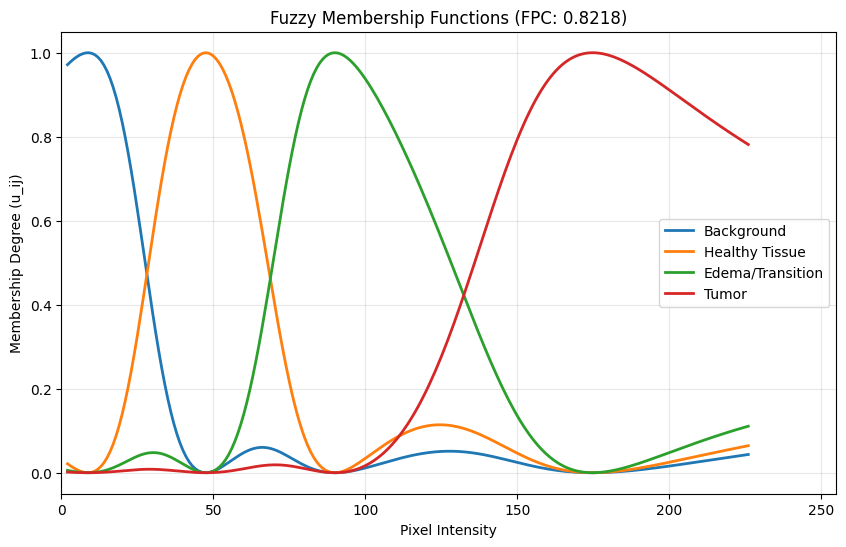

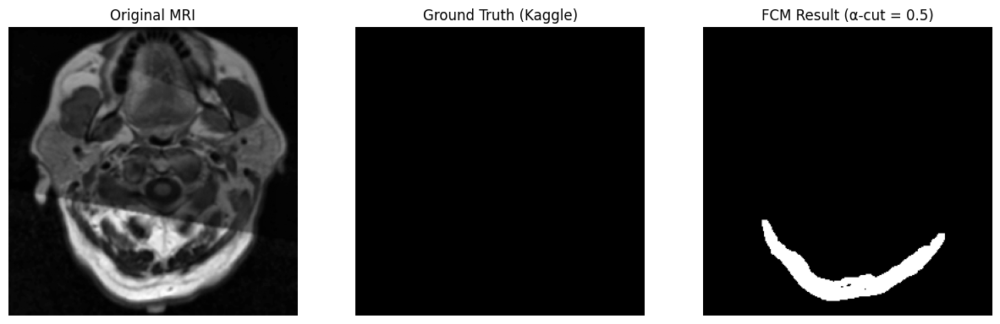

Dice Similarity Coefficient: 0.0000


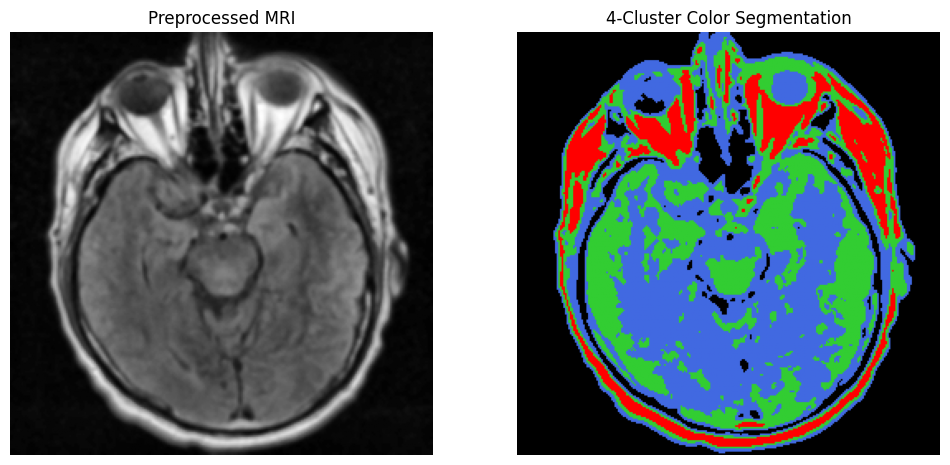

Processed: ./data\kaggle_3m\TCGA_CS_4941_19960909\TCGA_CS_4941_19960909_10.tif | Quality (FPC): 0.8240


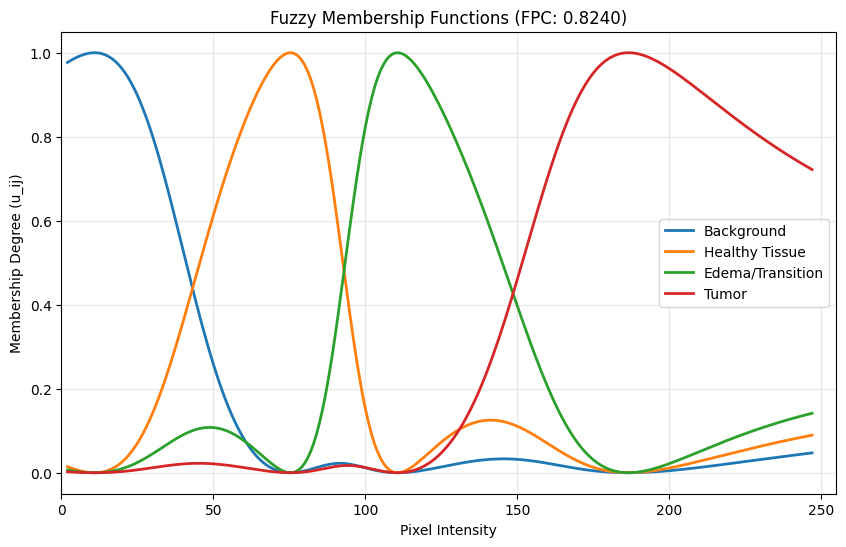

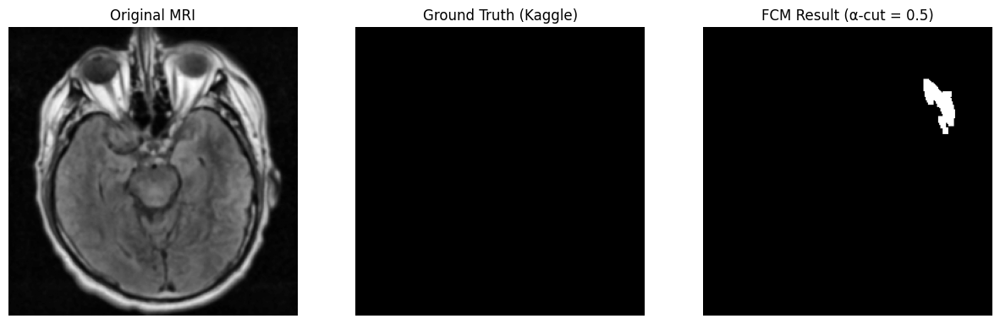

Dice Similarity Coefficient: 0.0000


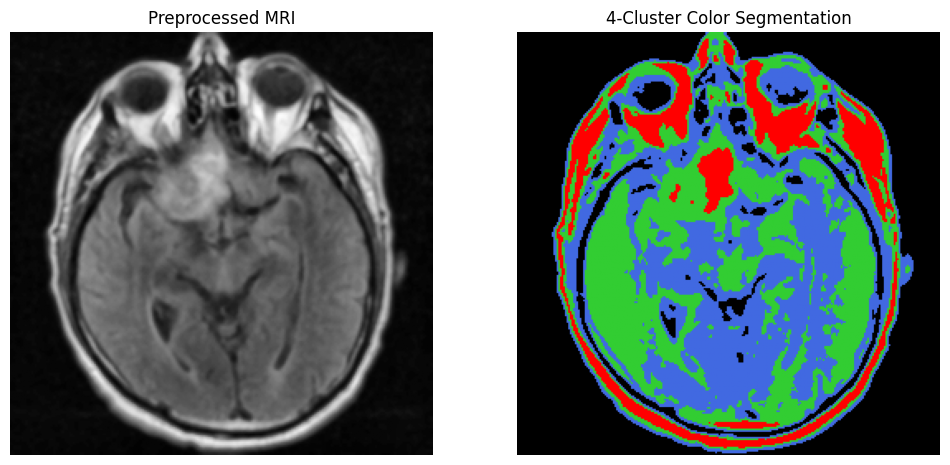

Processed: ./data\kaggle_3m\TCGA_CS_4941_19960909\TCGA_CS_4941_19960909_11.tif | Quality (FPC): 0.8181


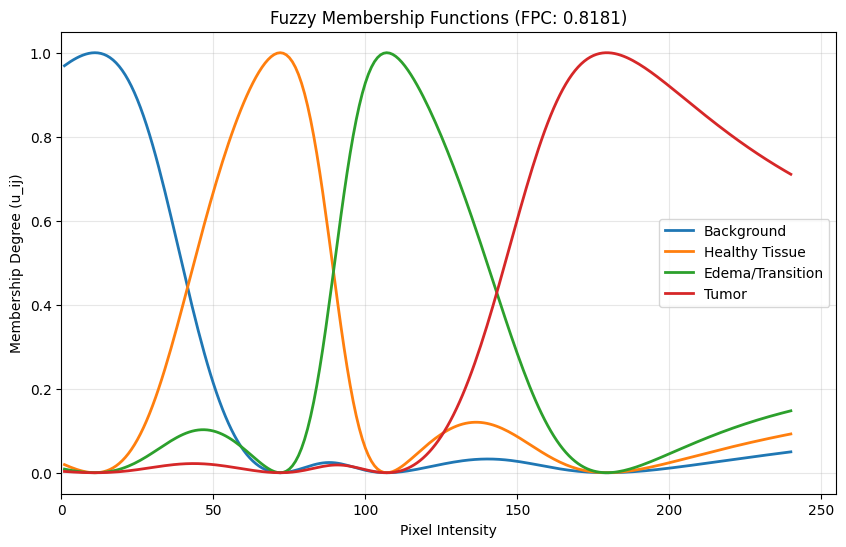

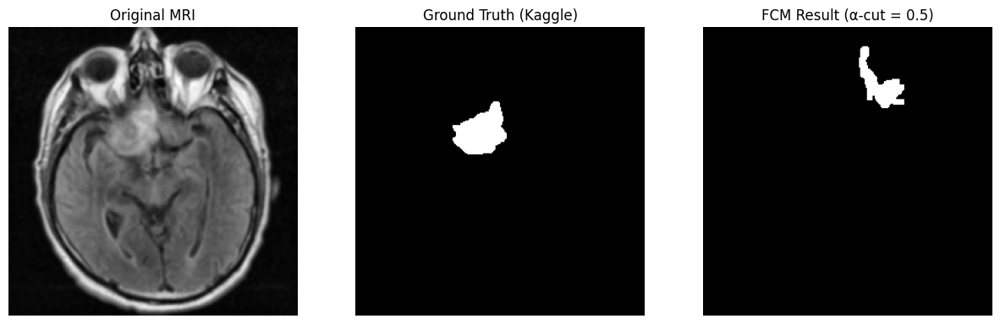

Dice Similarity Coefficient: 0.4821


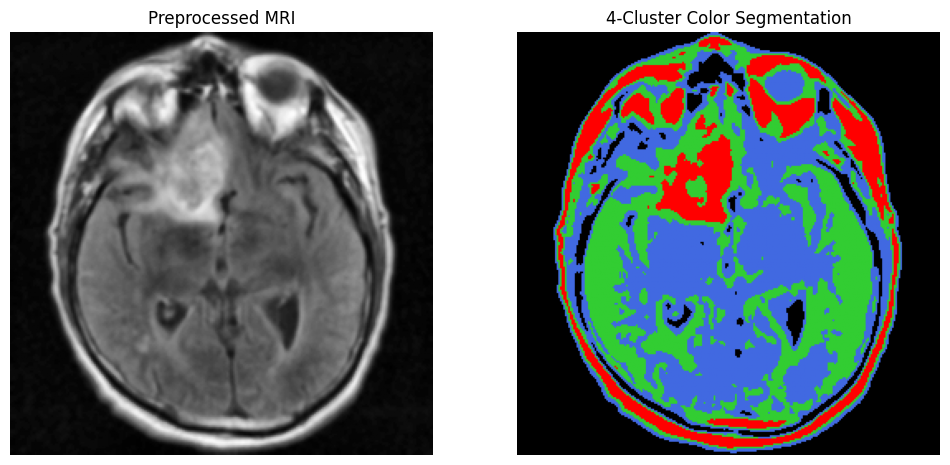

Processed: ./data\kaggle_3m\TCGA_CS_4941_19960909\TCGA_CS_4941_19960909_12.tif | Quality (FPC): 0.8238


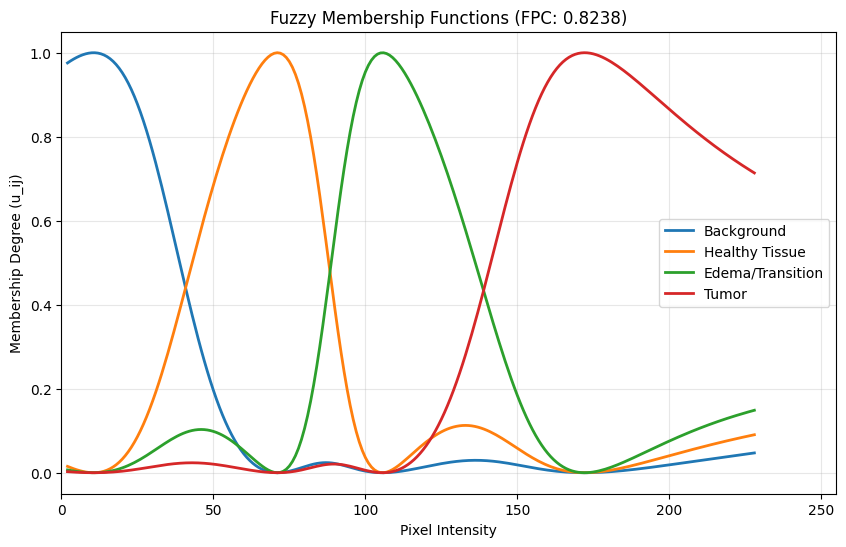

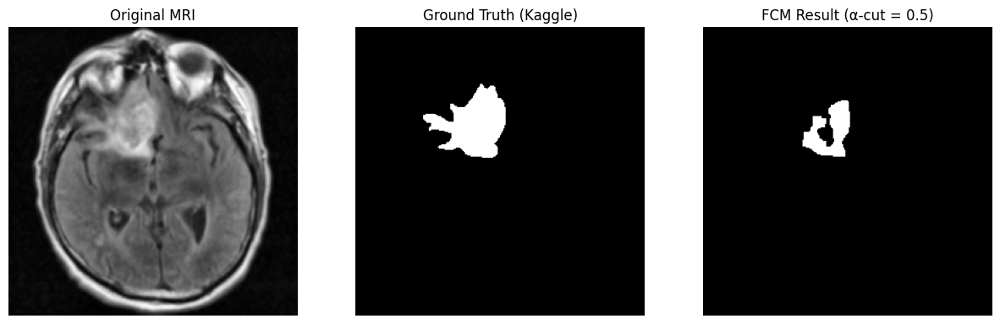

Dice Similarity Coefficient: 0.6290


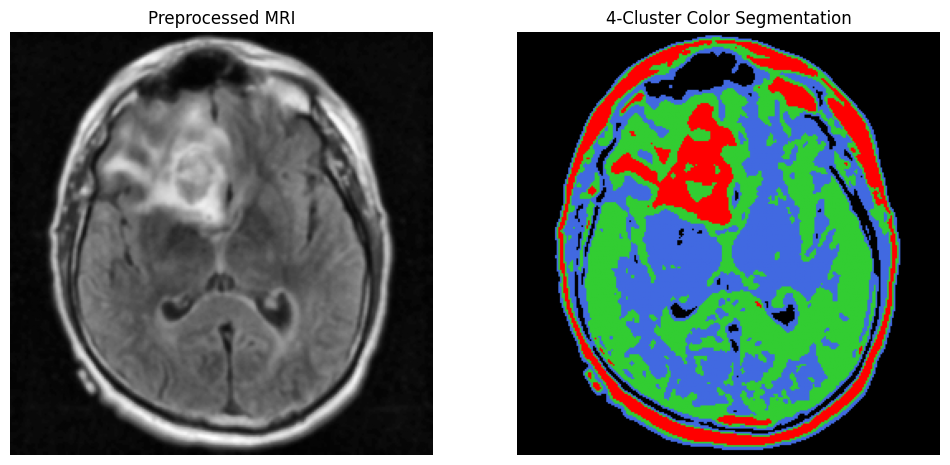

Processed: ./data\kaggle_3m\TCGA_CS_4941_19960909\TCGA_CS_4941_19960909_13.tif | Quality (FPC): 0.8315


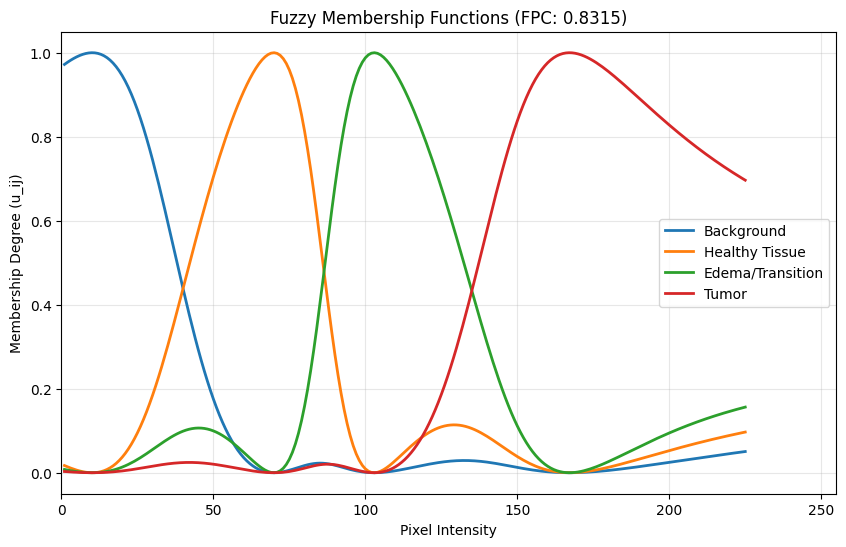

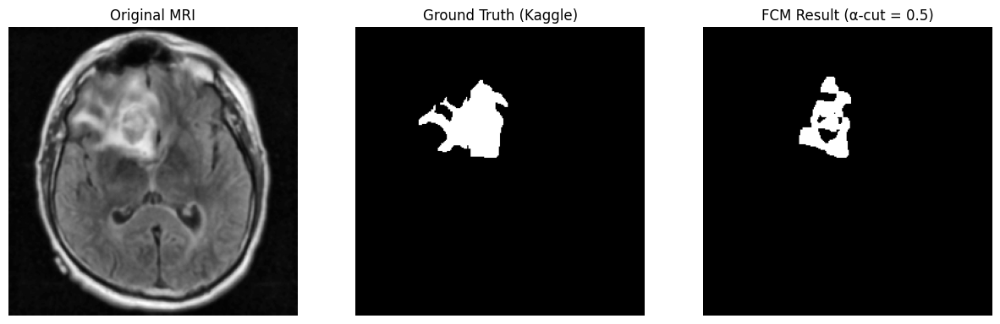

Dice Similarity Coefficient: 0.2700


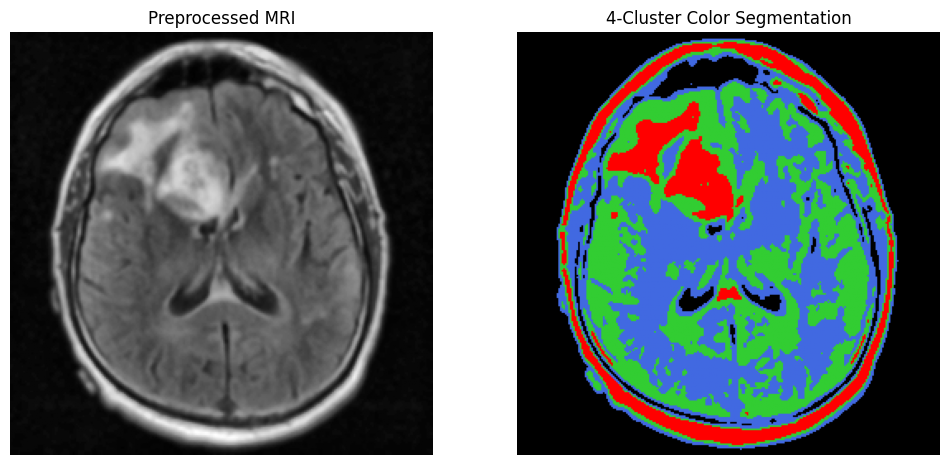

Processed: ./data\kaggle_3m\TCGA_CS_4941_19960909\TCGA_CS_4941_19960909_14.tif | Quality (FPC): 0.8328


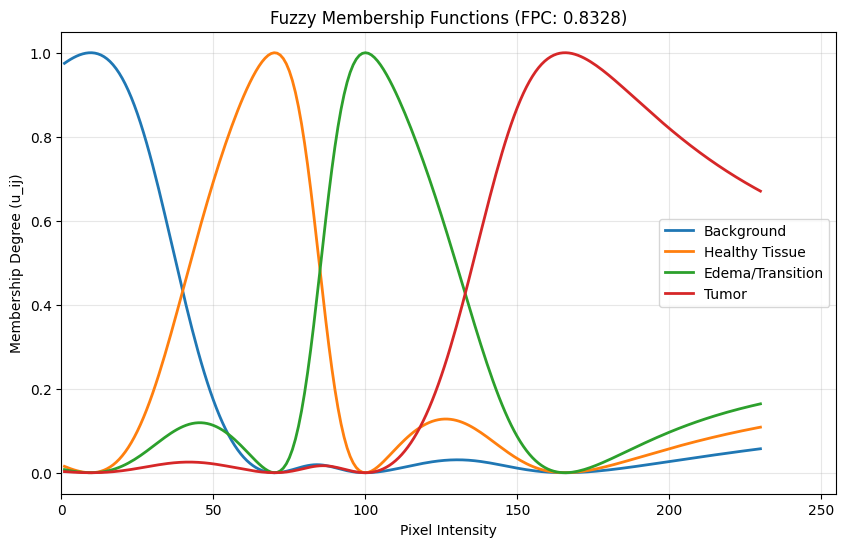

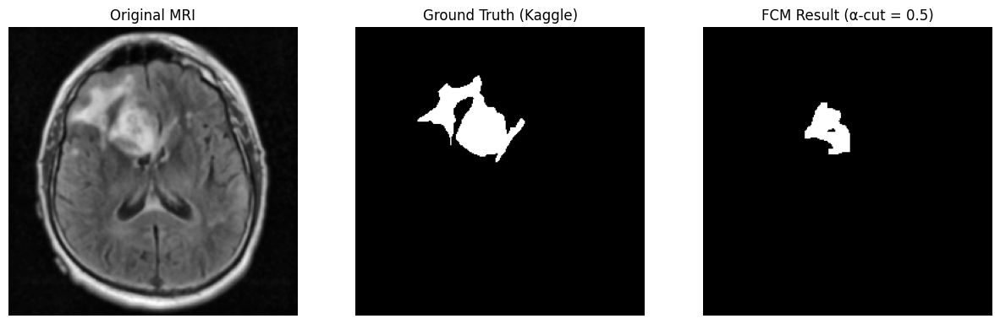

Dice Similarity Coefficient: 0.5431


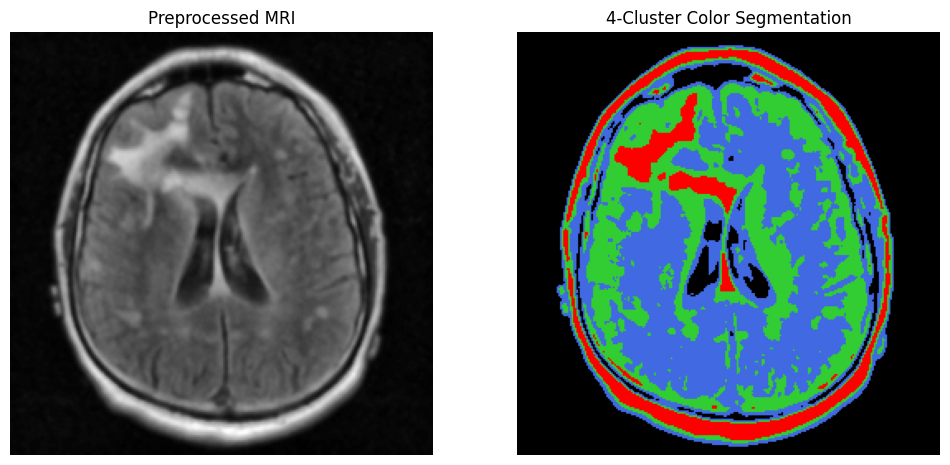

Processed: ./data\kaggle_3m\TCGA_CS_4941_19960909\TCGA_CS_4941_19960909_15.tif | Quality (FPC): 0.8381


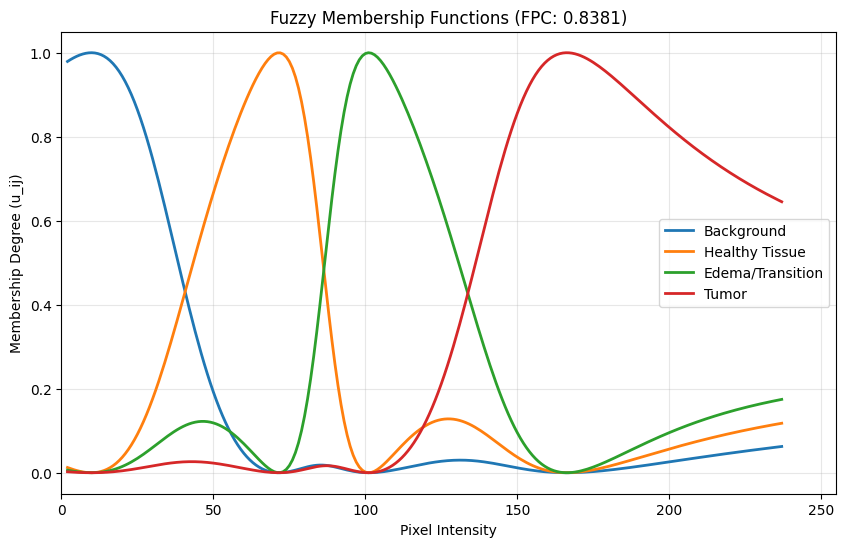

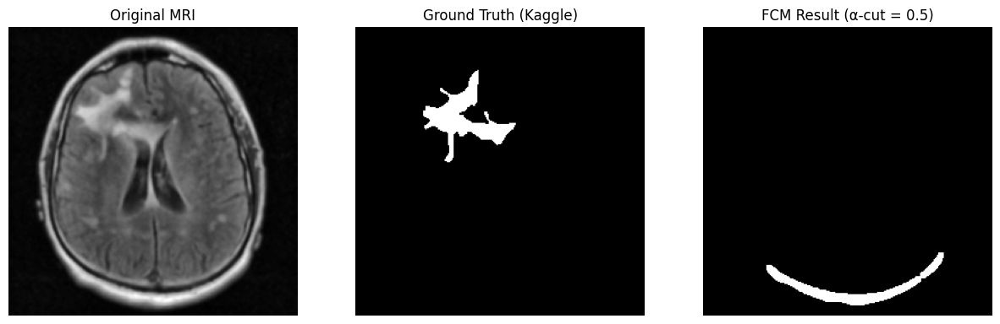

Dice Similarity Coefficient: 0.3051


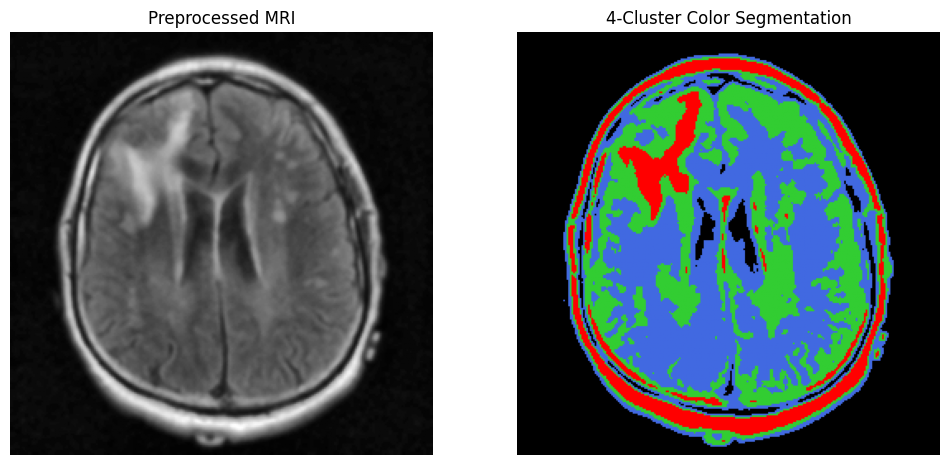

Processed: ./data\kaggle_3m\TCGA_CS_4941_19960909\TCGA_CS_4941_19960909_16.tif | Quality (FPC): 0.8446


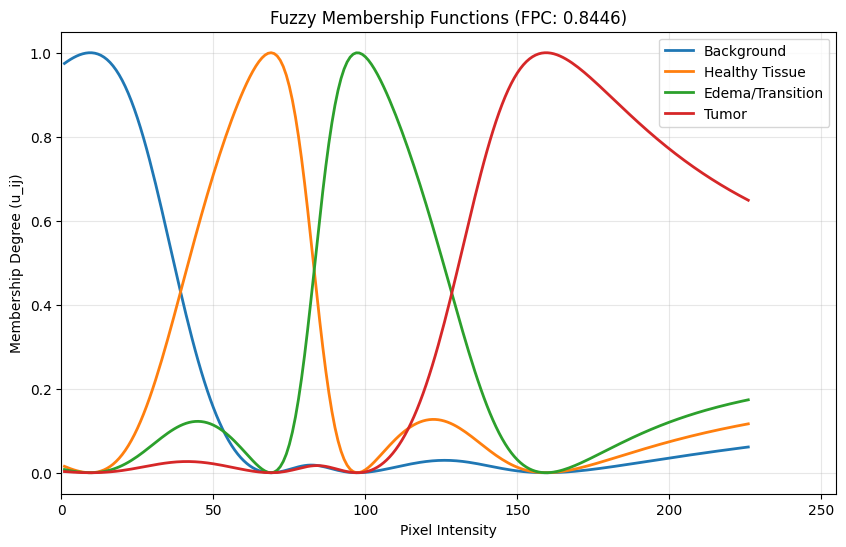

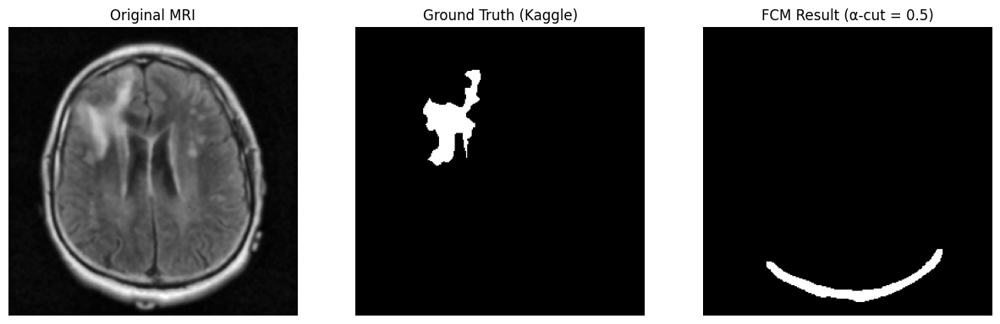

Dice Similarity Coefficient: 0.5713


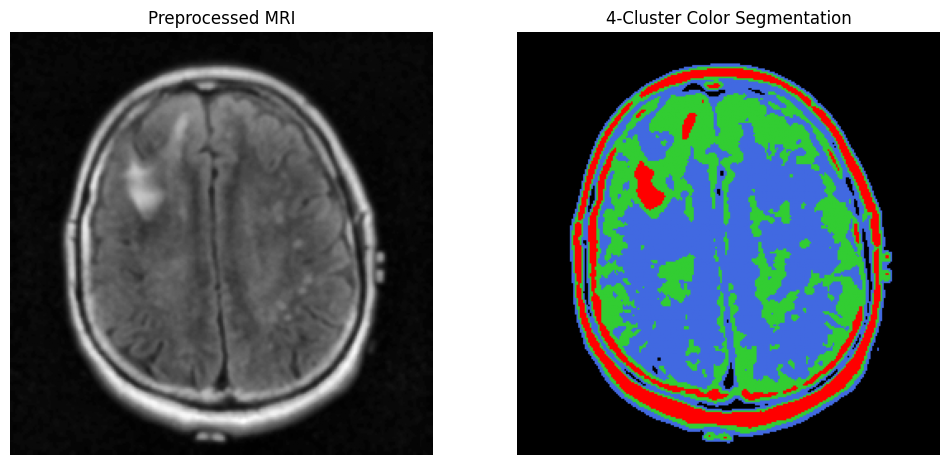

Processed: ./data\kaggle_3m\TCGA_CS_4941_19960909\TCGA_CS_4941_19960909_17.tif | Quality (FPC): 0.8603


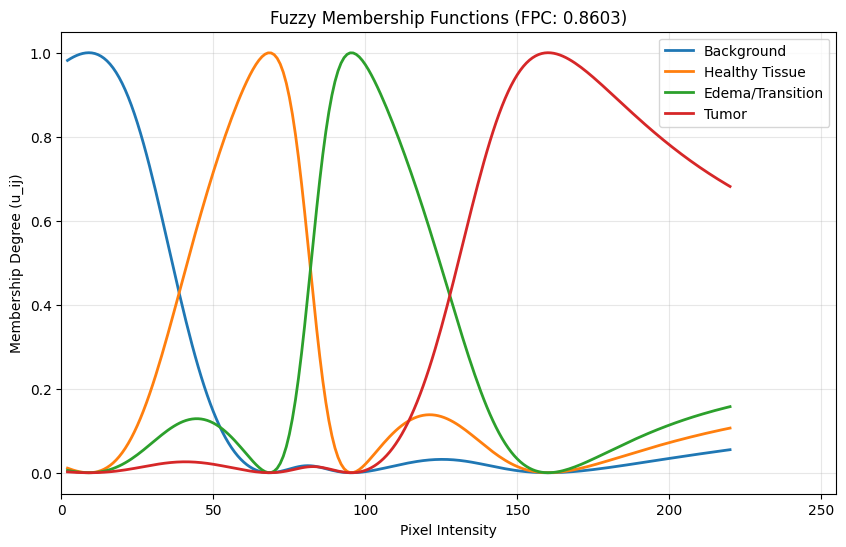

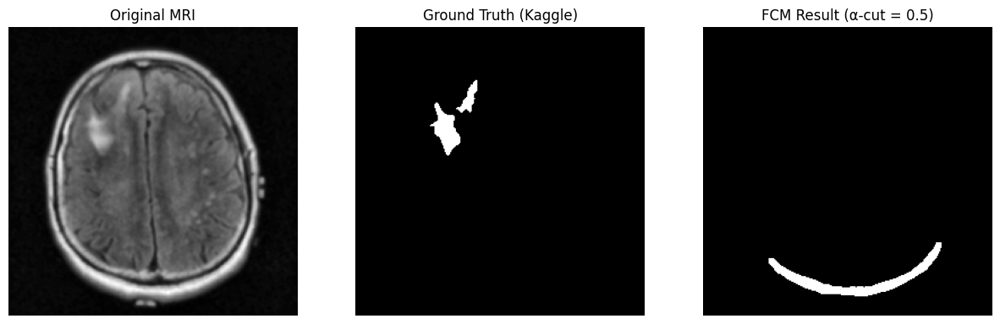

Dice Similarity Coefficient: 0.4602


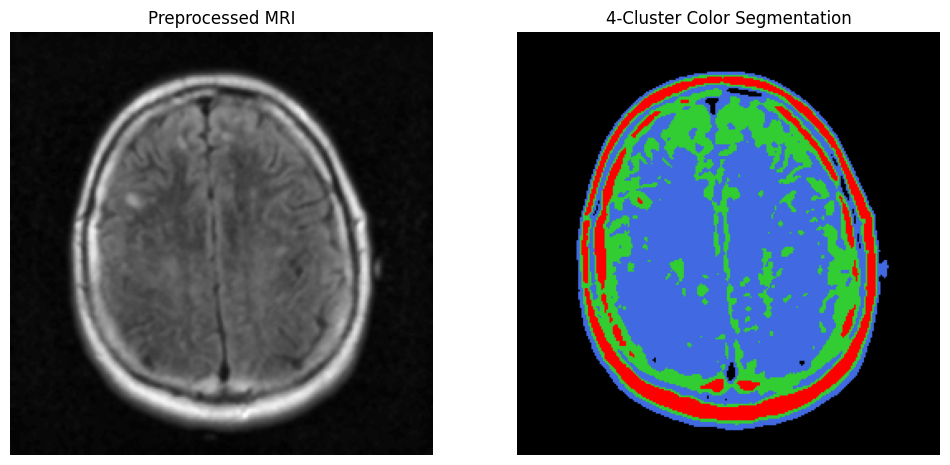

Processed: ./data\kaggle_3m\TCGA_CS_4941_19960909\TCGA_CS_4941_19960909_18.tif | Quality (FPC): 0.8751


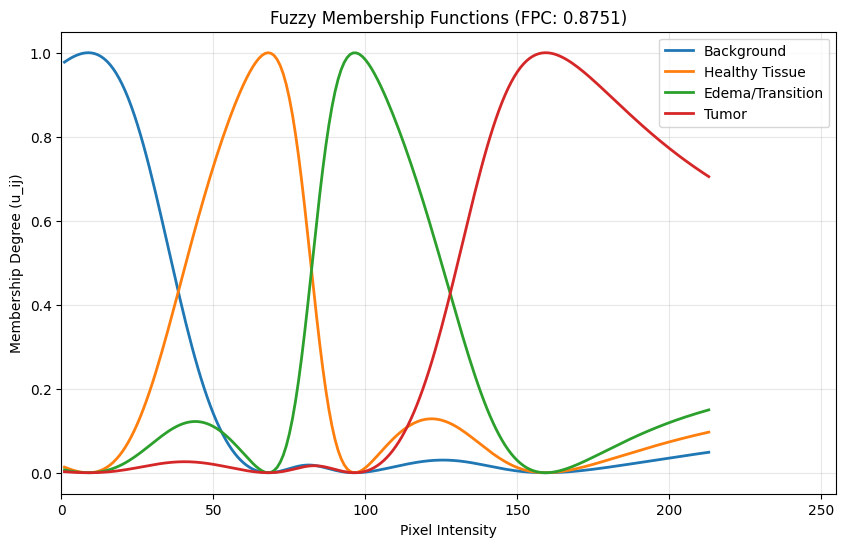

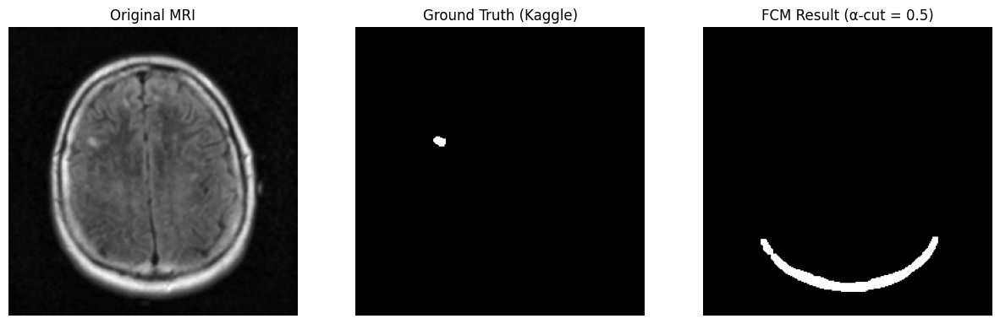

Dice Similarity Coefficient: 0.0000


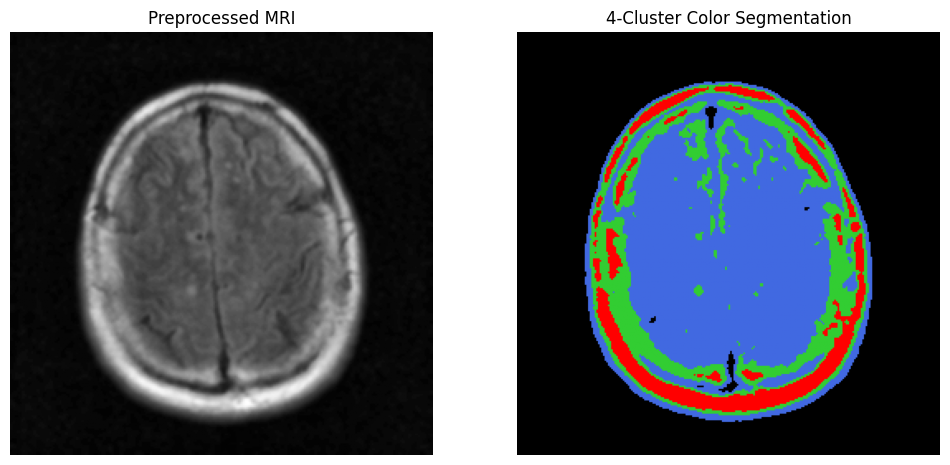

Processed: ./data\kaggle_3m\TCGA_CS_4941_19960909\TCGA_CS_4941_19960909_19.tif | Quality (FPC): 0.8992


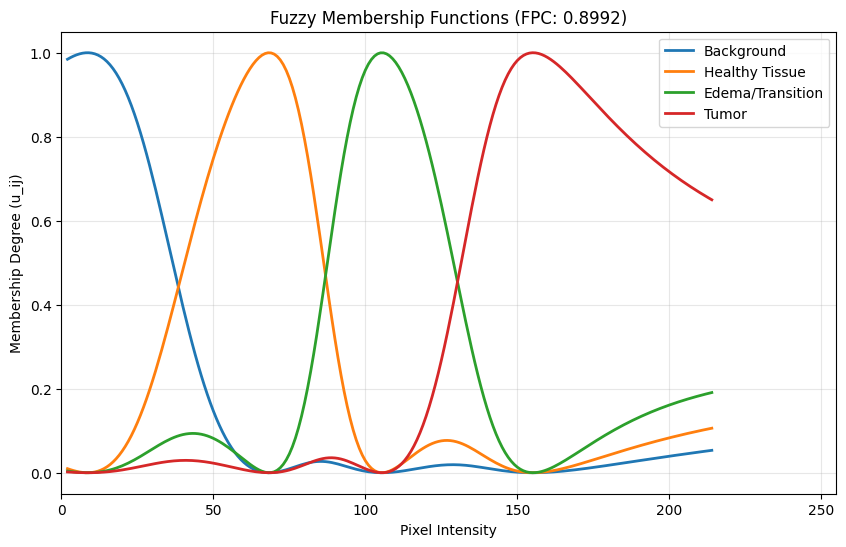

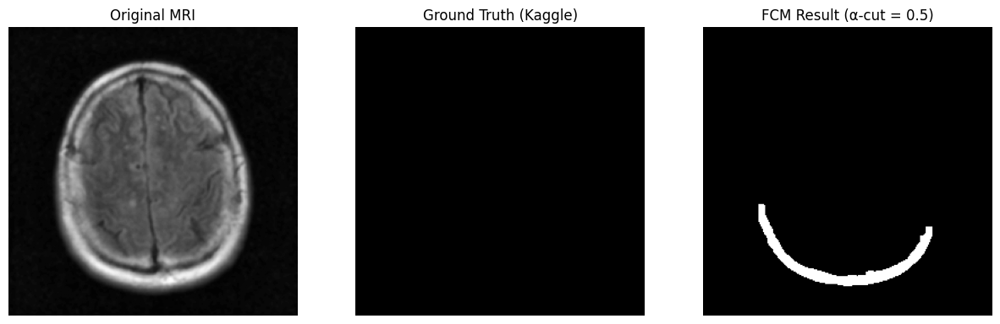

Dice Similarity Coefficient: 0.0000


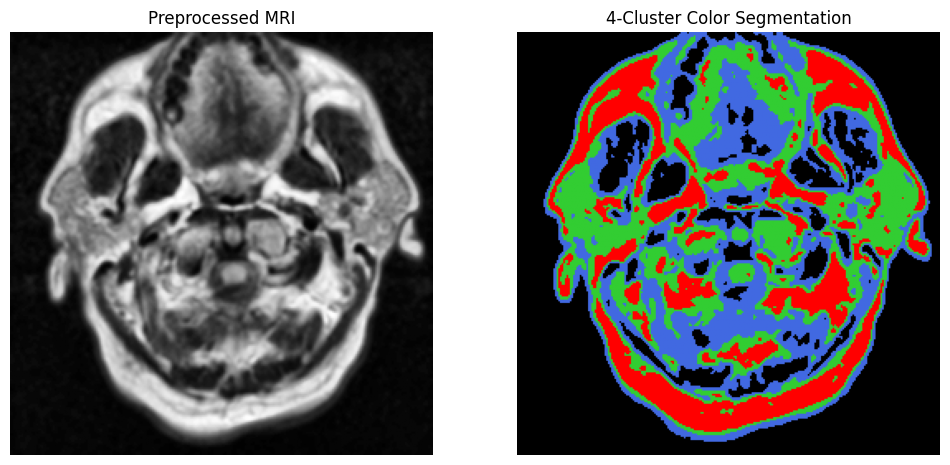

Processed: ./data\kaggle_3m\TCGA_CS_4941_19960909\TCGA_CS_4941_19960909_2.tif | Quality (FPC): 0.8198


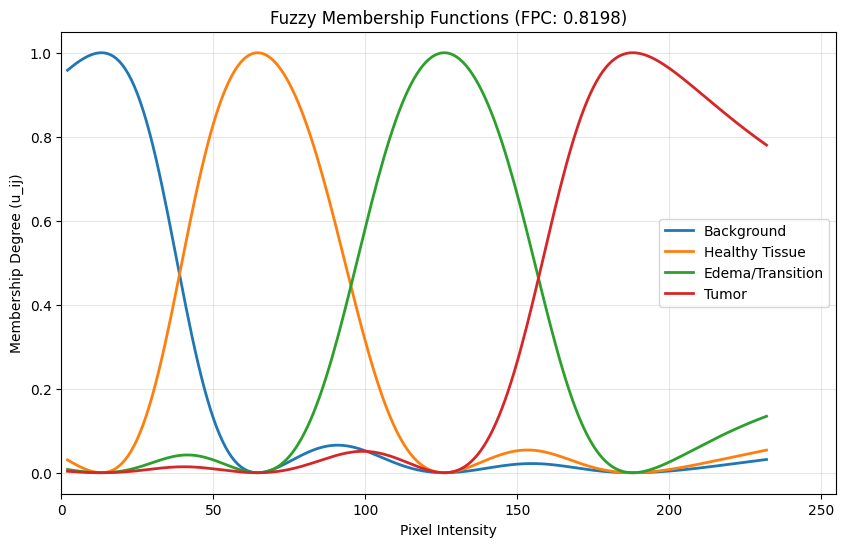

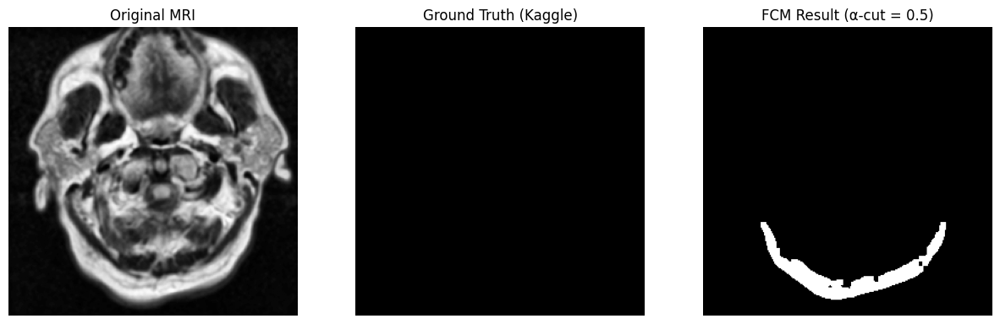

Dice Similarity Coefficient: 0.0000


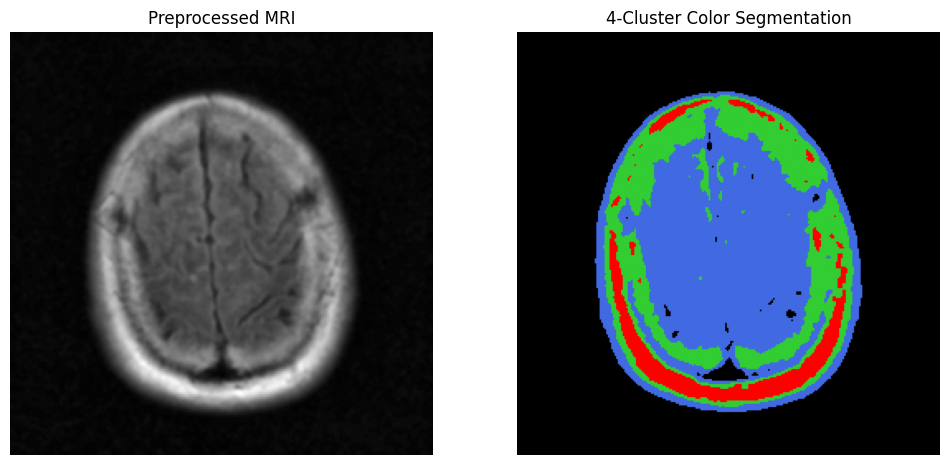

Processed: ./data\kaggle_3m\TCGA_CS_4941_19960909\TCGA_CS_4941_19960909_20.tif | Quality (FPC): 0.9083


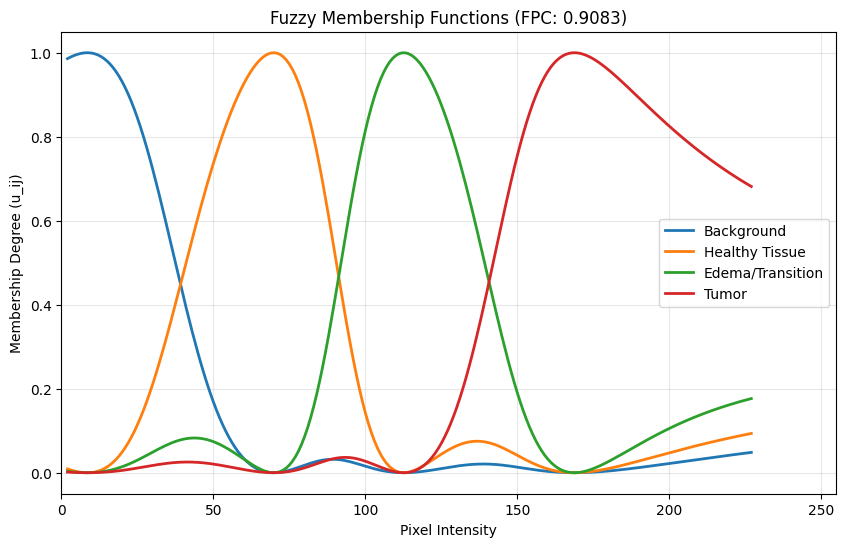

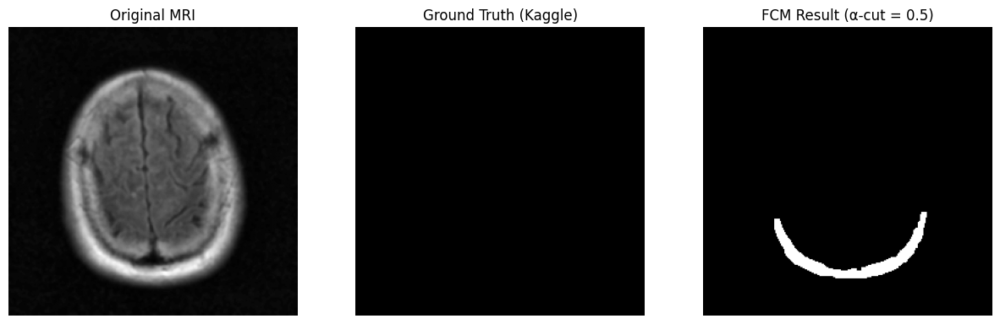

Dice Similarity Coefficient: 0.0000


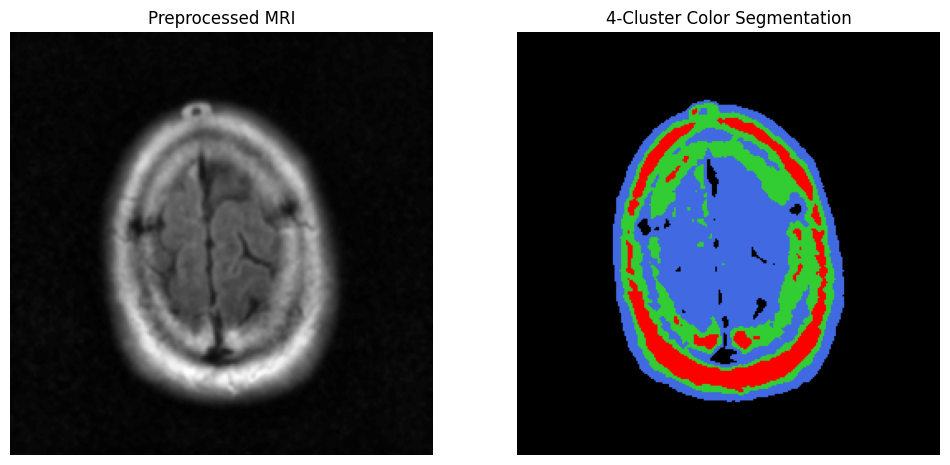

Processed: ./data\kaggle_3m\TCGA_CS_4941_19960909\TCGA_CS_4941_19960909_21.tif | Quality (FPC): 0.9103


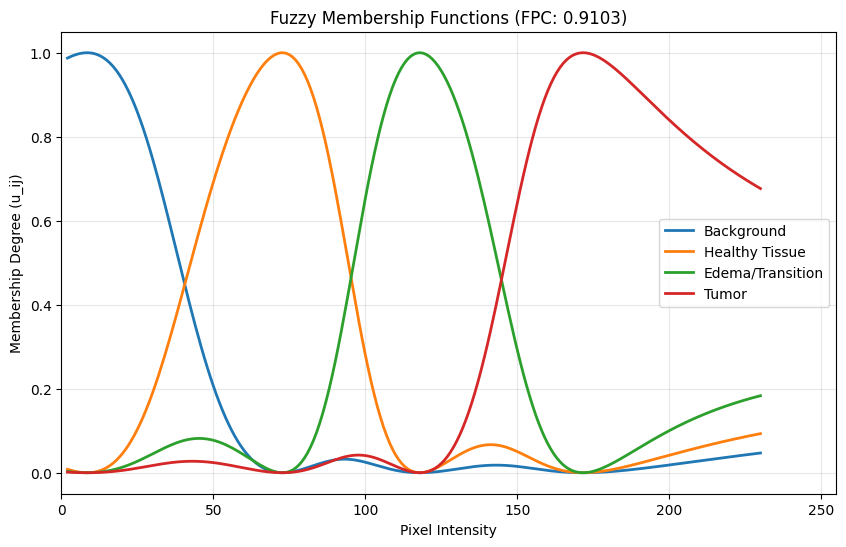

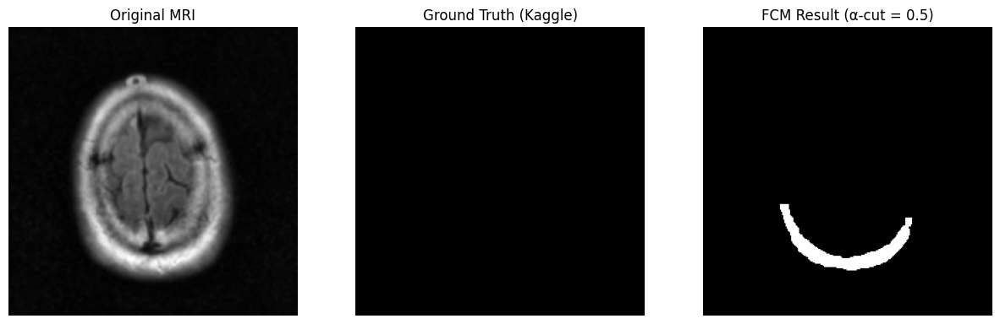

Dice Similarity Coefficient: 0.0000


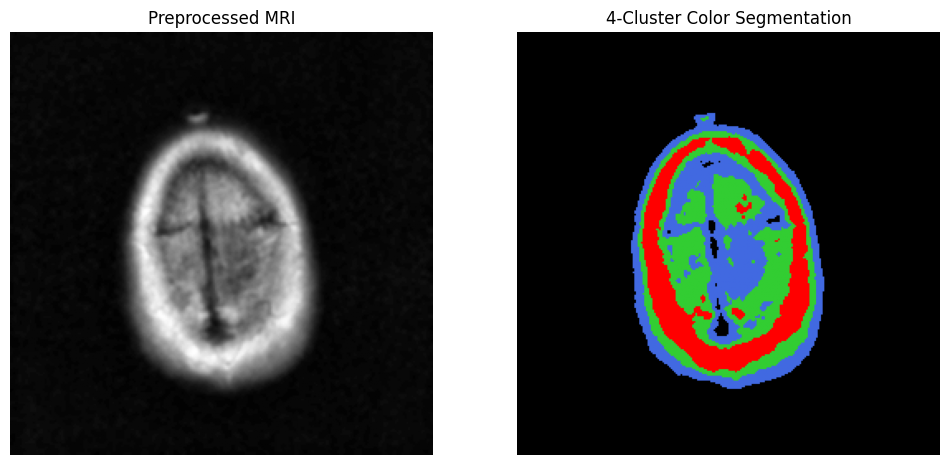

Processed: ./data\kaggle_3m\TCGA_CS_4941_19960909\TCGA_CS_4941_19960909_22.tif | Quality (FPC): 0.9327


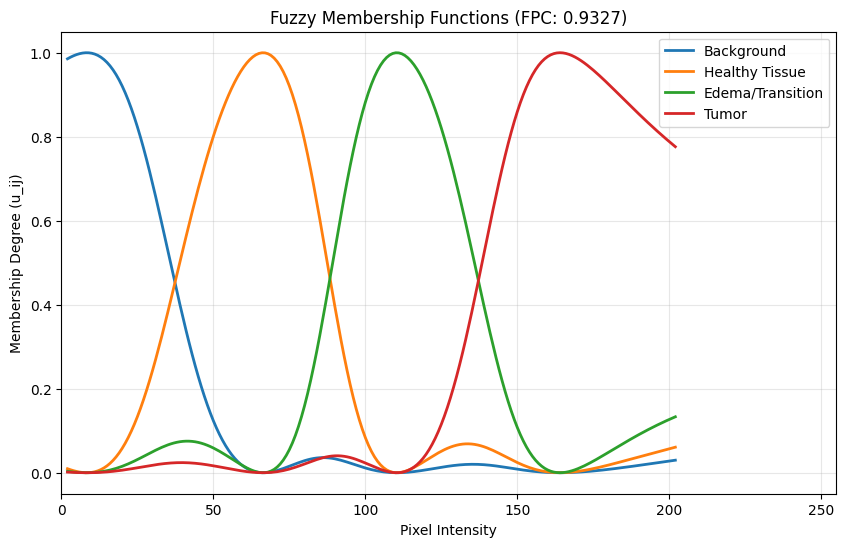

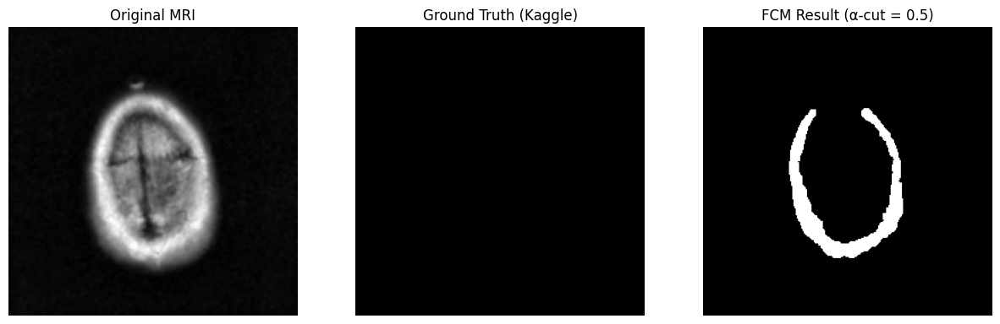

Dice Similarity Coefficient: 0.0000


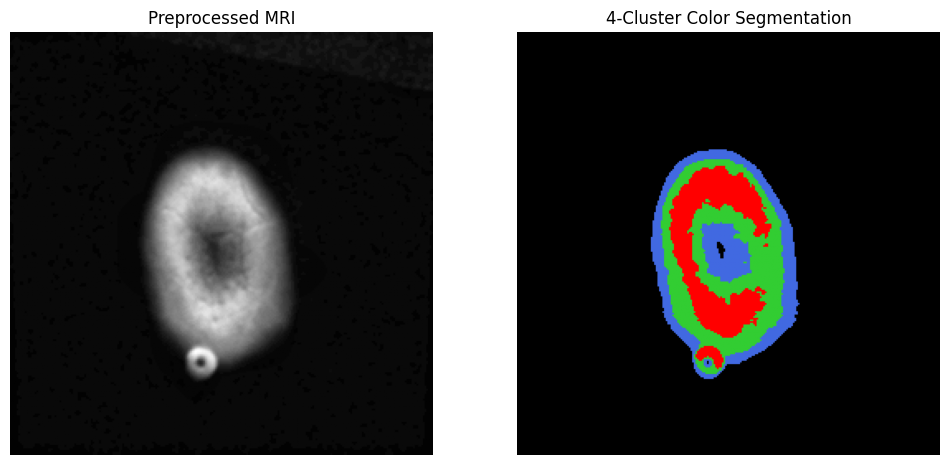

Processed: ./data\kaggle_3m\TCGA_CS_4941_19960909\TCGA_CS_4941_19960909_23.tif | Quality (FPC): 0.9544


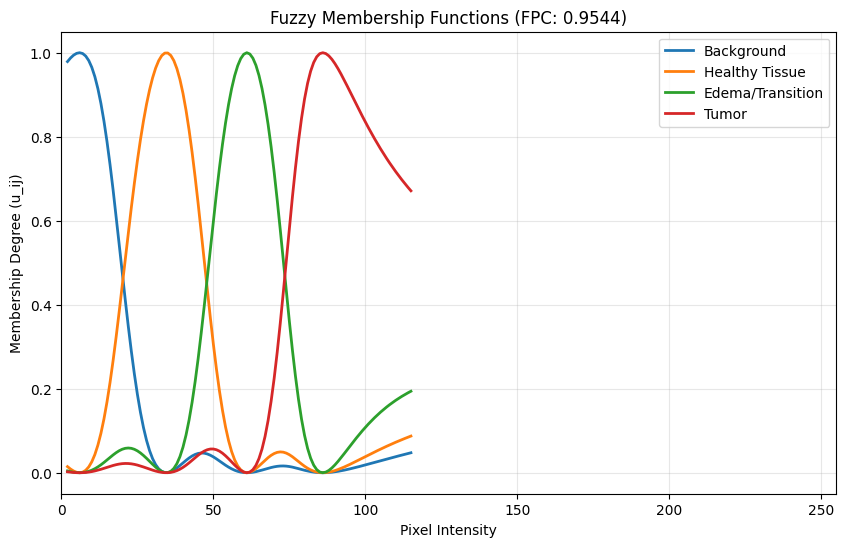

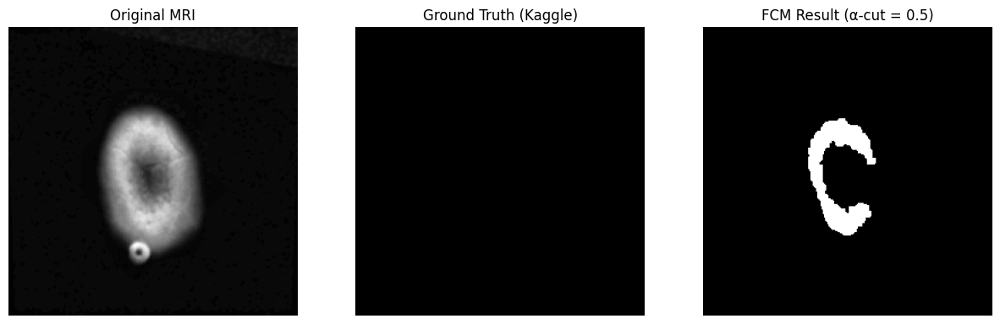

Dice Similarity Coefficient: 0.0000


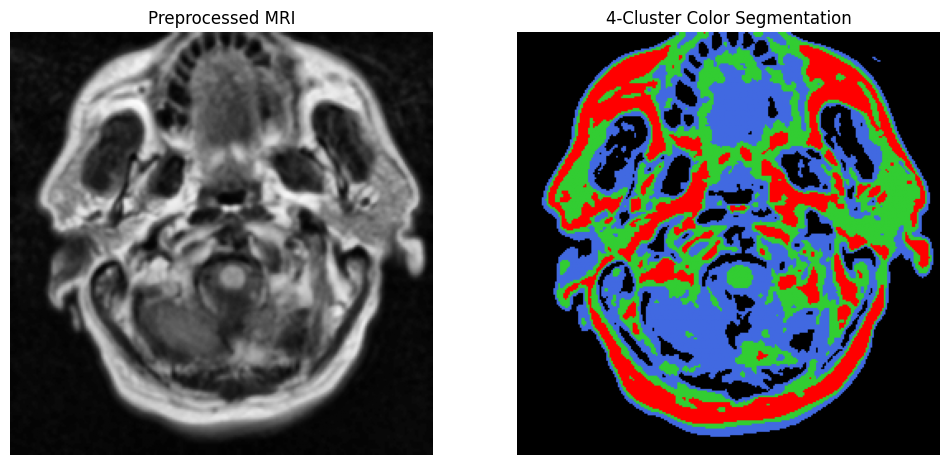

Processed: ./data\kaggle_3m\TCGA_CS_4941_19960909\TCGA_CS_4941_19960909_3.tif | Quality (FPC): 0.8150


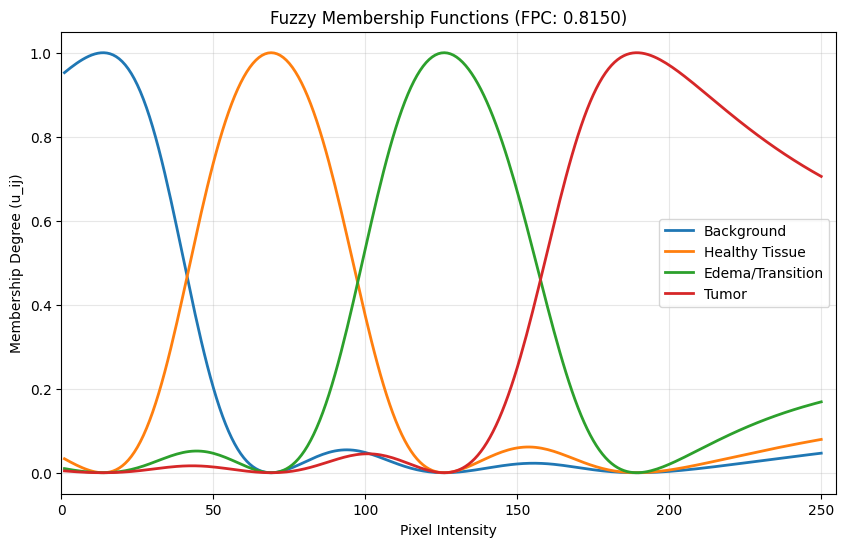

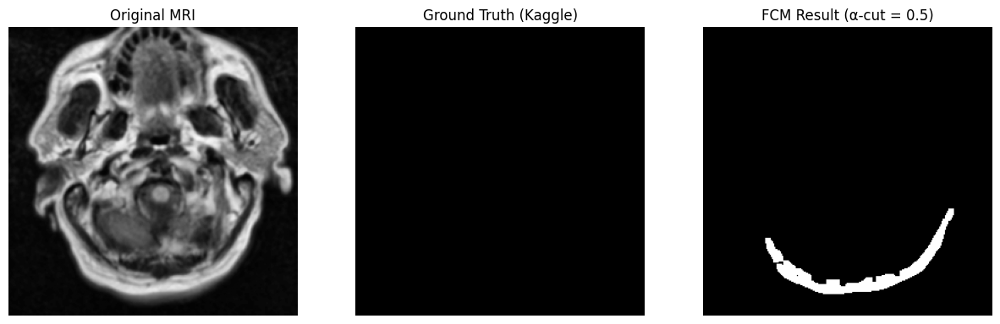

Dice Similarity Coefficient: 0.0000


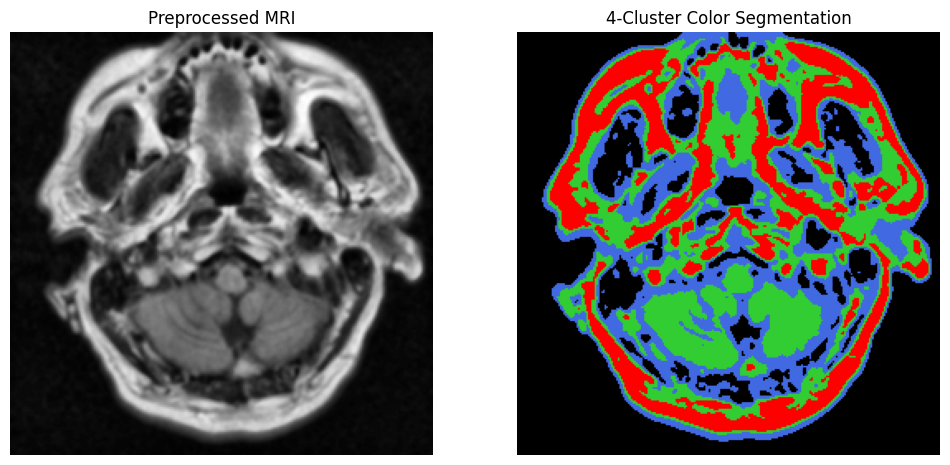

Processed: ./data\kaggle_3m\TCGA_CS_4941_19960909\TCGA_CS_4941_19960909_4.tif | Quality (FPC): 0.8180


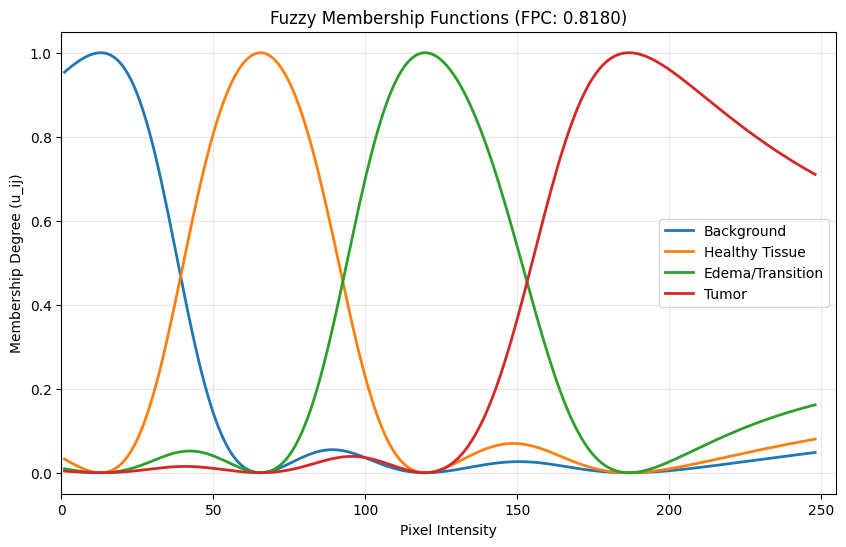

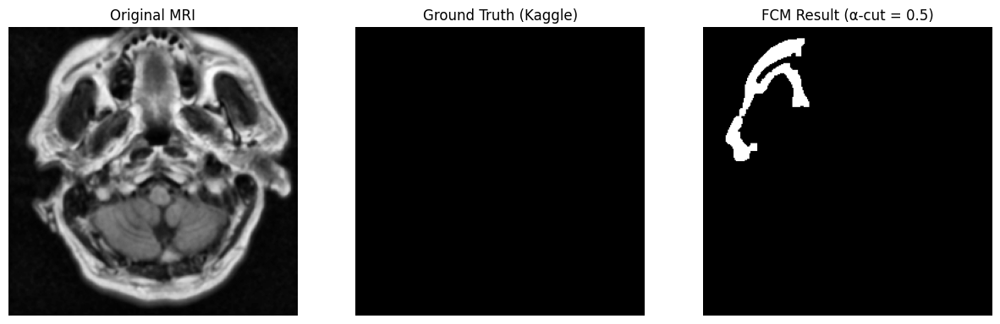

Dice Similarity Coefficient: 0.0000


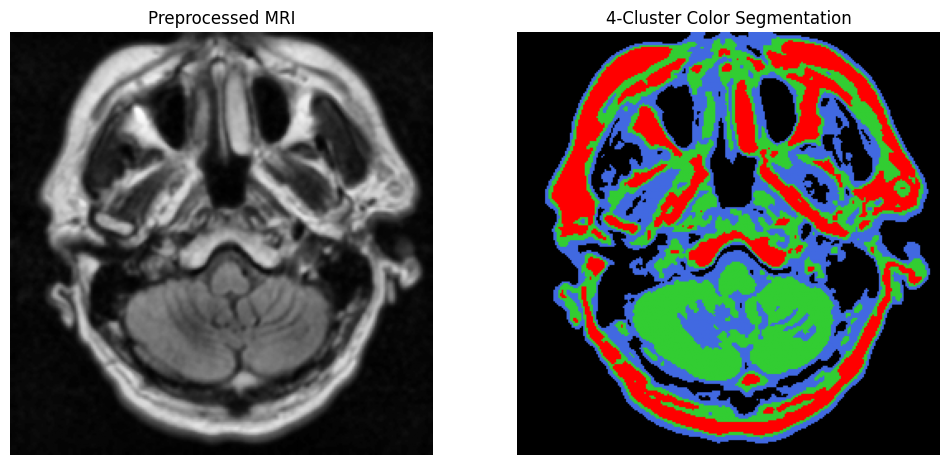

Processed: ./data\kaggle_3m\TCGA_CS_4941_19960909\TCGA_CS_4941_19960909_5.tif | Quality (FPC): 0.8294


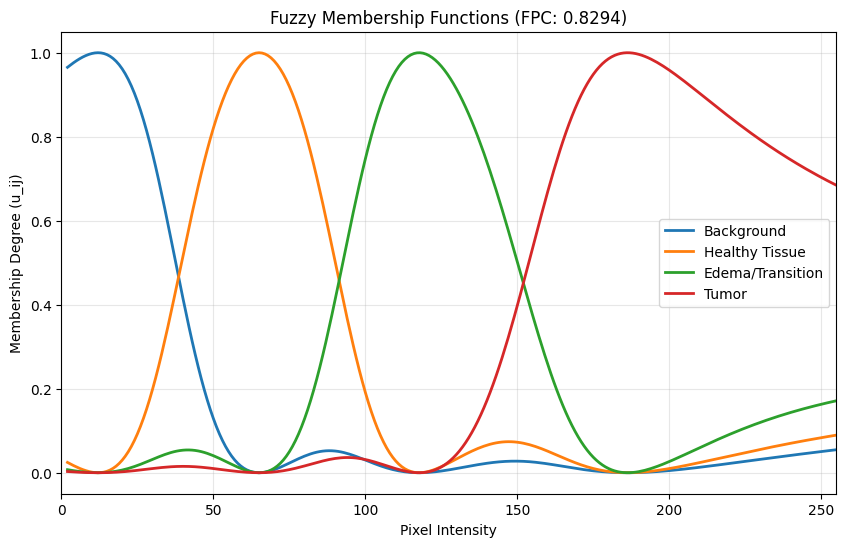

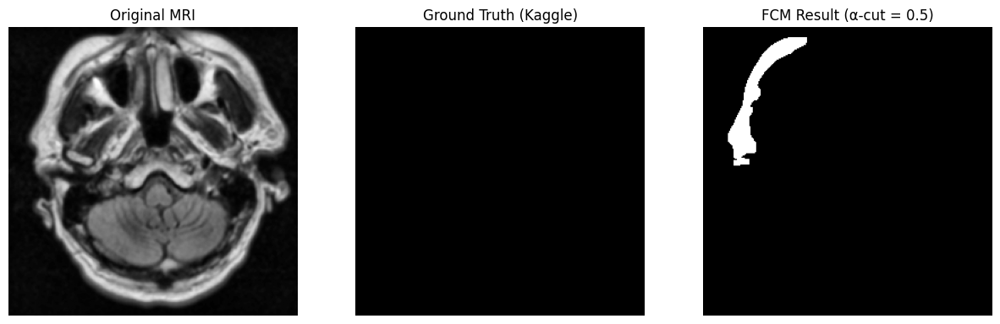

Dice Similarity Coefficient: 0.0000


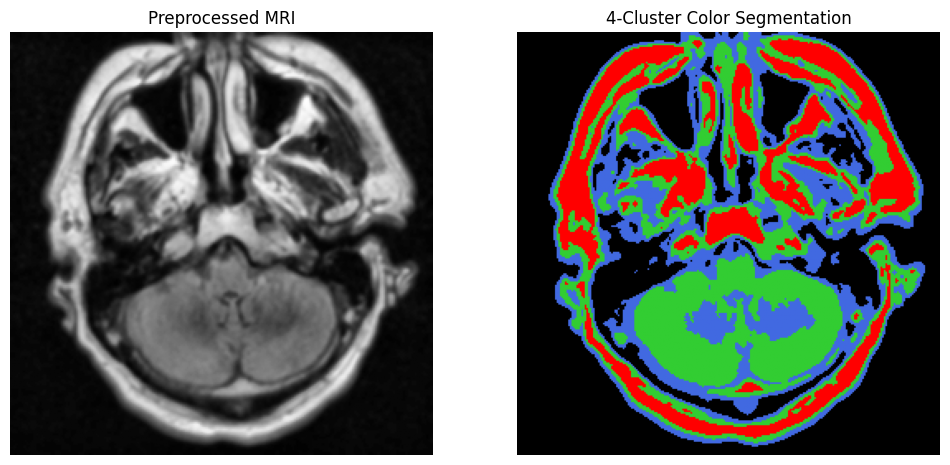

Processed: ./data\kaggle_3m\TCGA_CS_4941_19960909\TCGA_CS_4941_19960909_6.tif | Quality (FPC): 0.8360


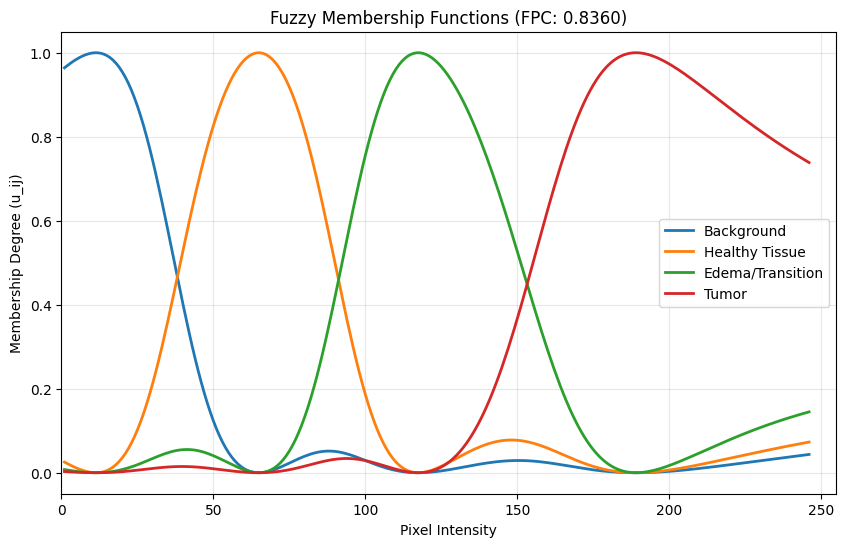

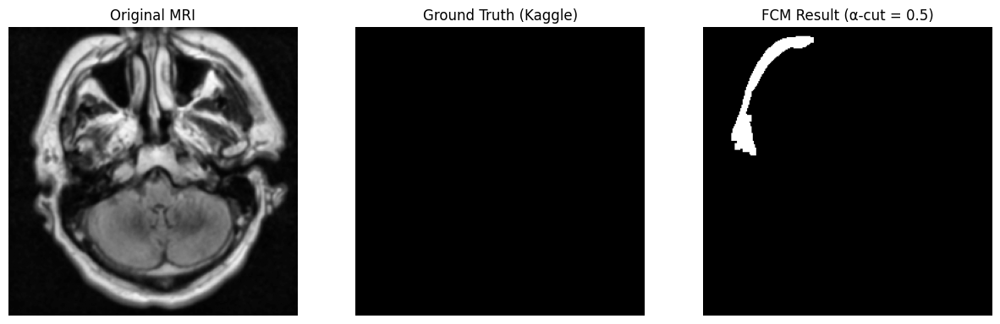

Dice Similarity Coefficient: 0.0000


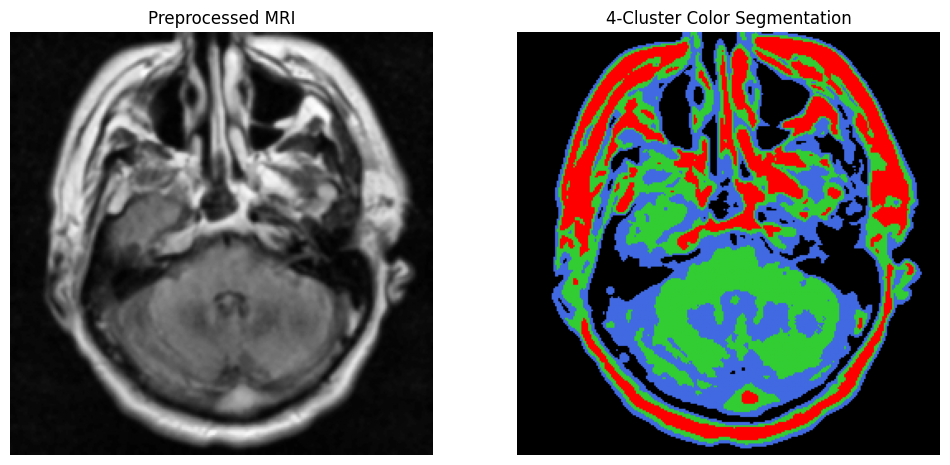

Processed: ./data\kaggle_3m\TCGA_CS_4941_19960909\TCGA_CS_4941_19960909_7.tif | Quality (FPC): 0.8249


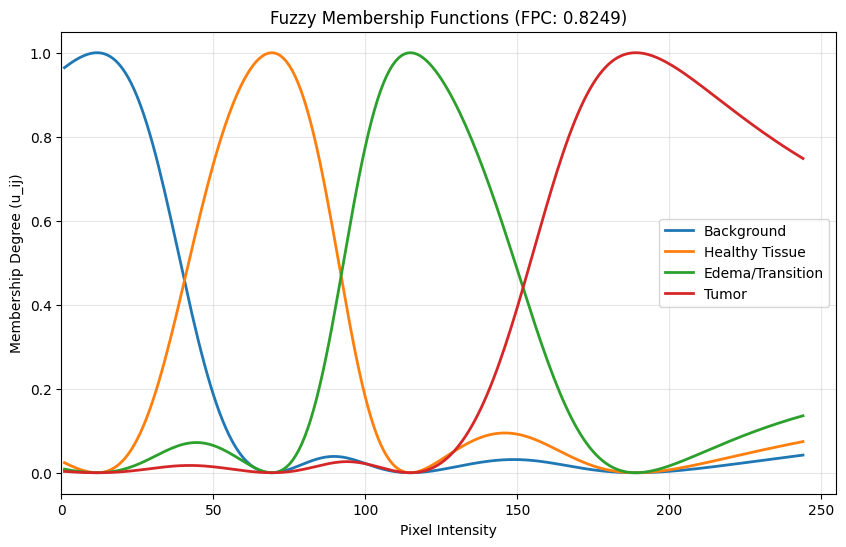

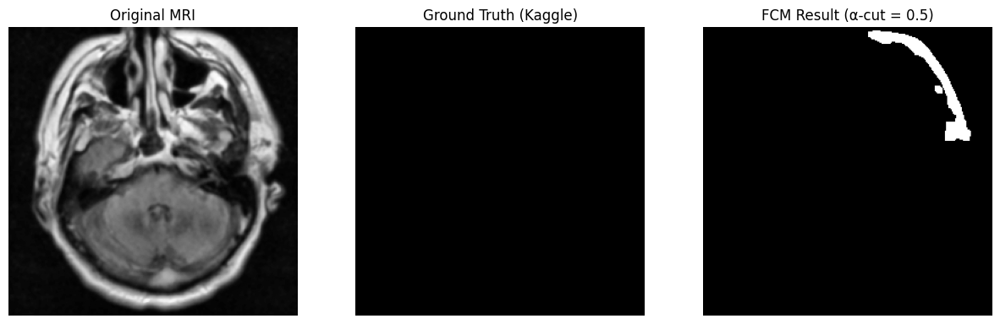

Dice Similarity Coefficient: 0.0000


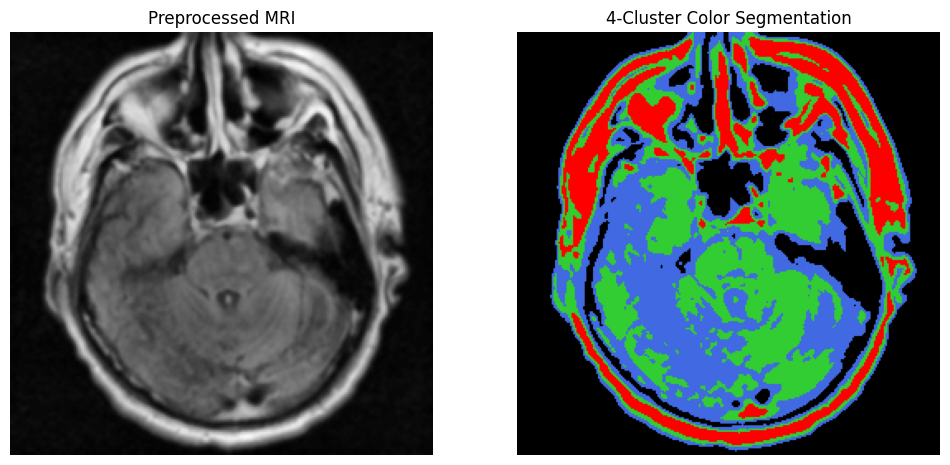

Processed: ./data\kaggle_3m\TCGA_CS_4941_19960909\TCGA_CS_4941_19960909_8.tif | Quality (FPC): 0.8221


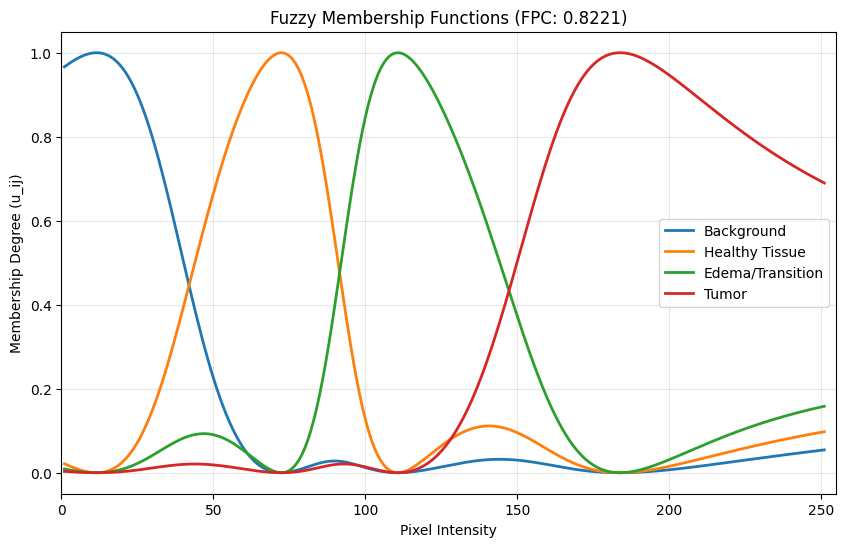

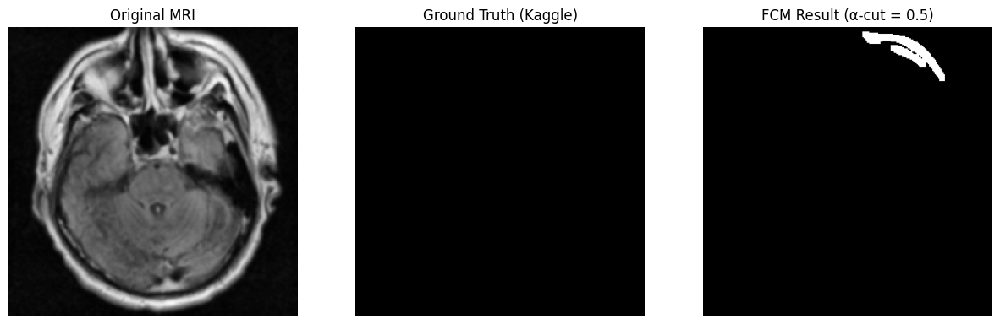

Dice Similarity Coefficient: 0.0000


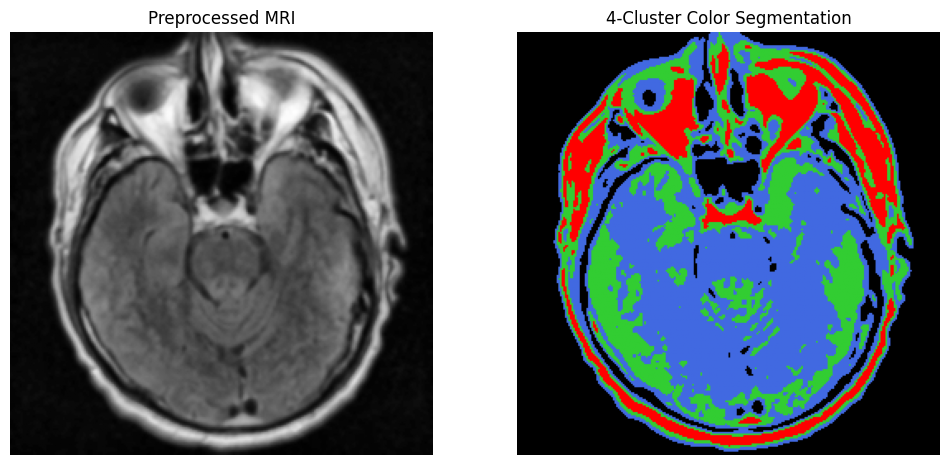

Processed: ./data\kaggle_3m\TCGA_CS_4941_19960909\TCGA_CS_4941_19960909_9.tif | Quality (FPC): 0.8247


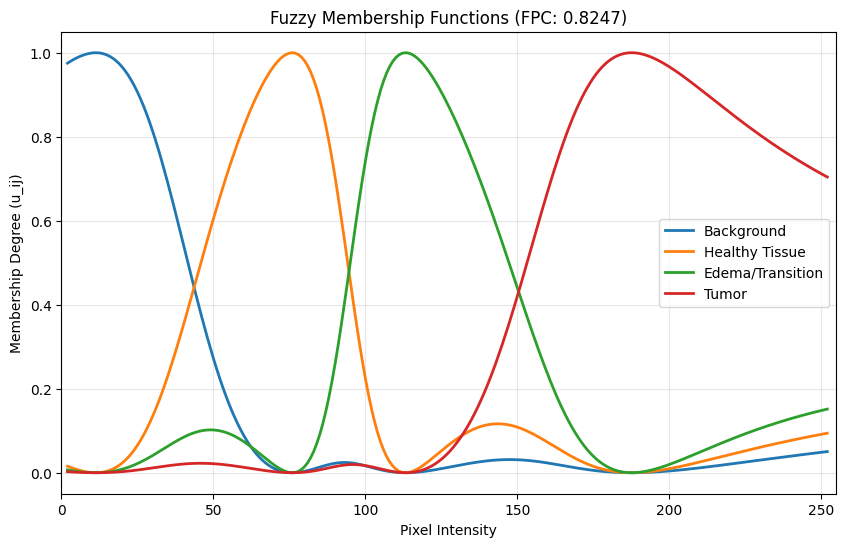

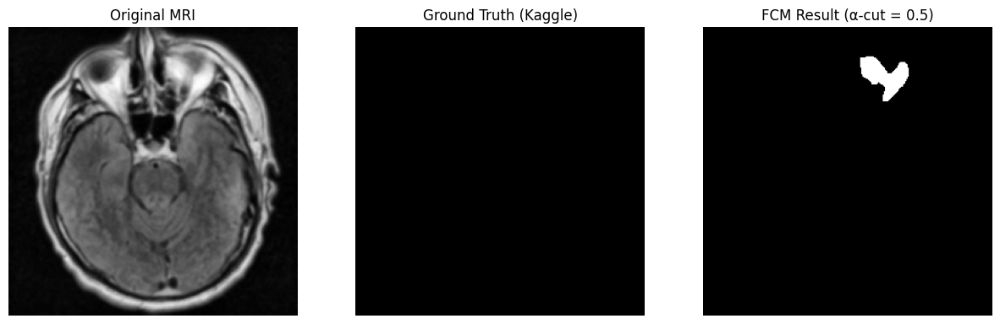

Dice Similarity Coefficient: 0.0000


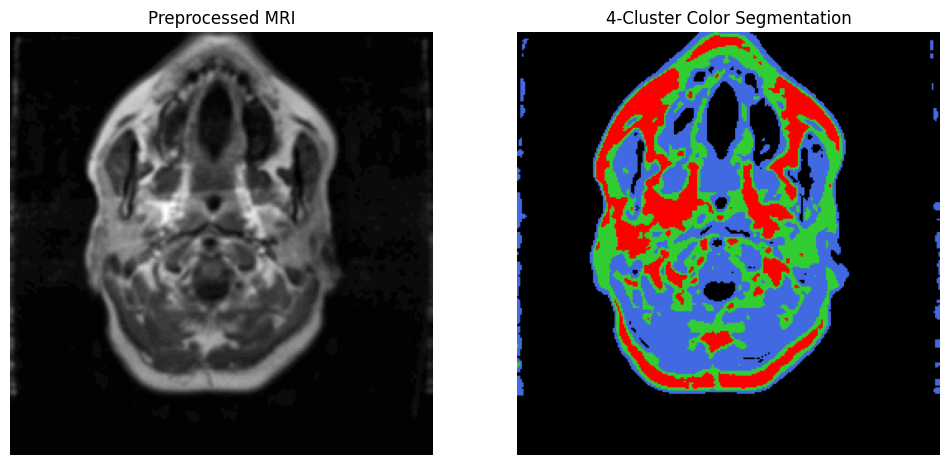

Processed: ./data\kaggle_3m\TCGA_CS_4942_19970222\TCGA_CS_4942_19970222_1.tif | Quality (FPC): 0.8736


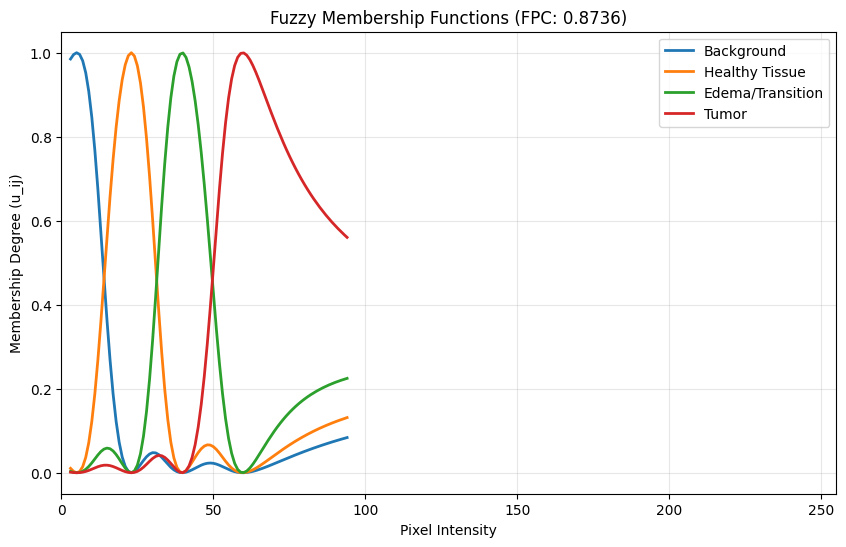

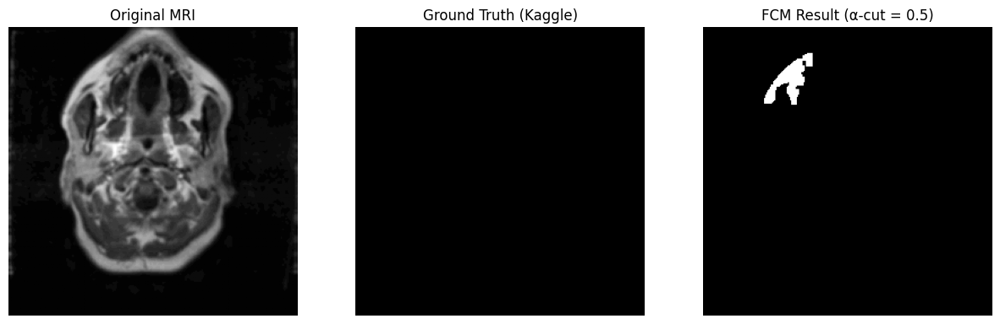

Dice Similarity Coefficient: 0.0000


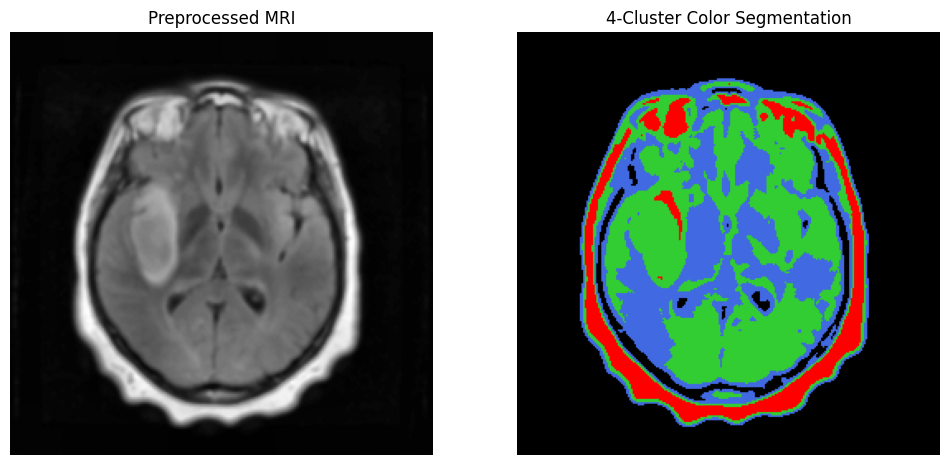

Processed: ./data\kaggle_3m\TCGA_CS_4942_19970222\TCGA_CS_4942_19970222_10.tif | Quality (FPC): 0.8718


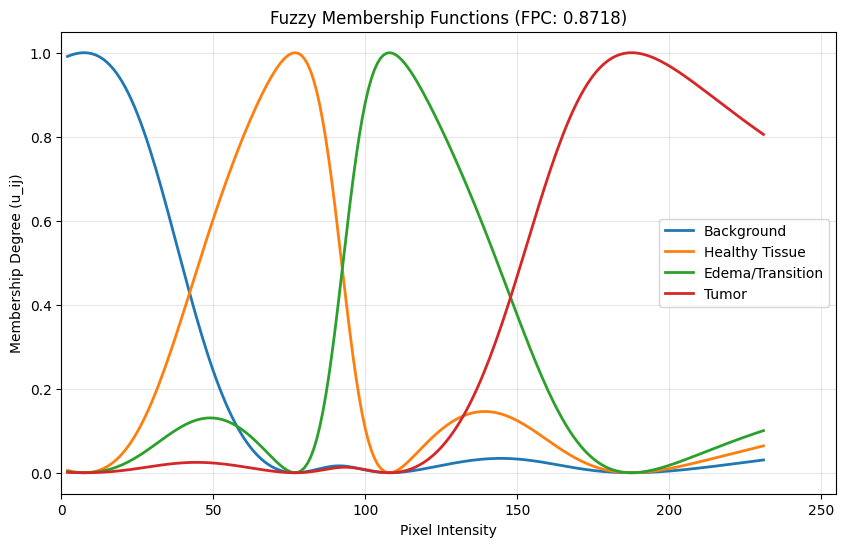

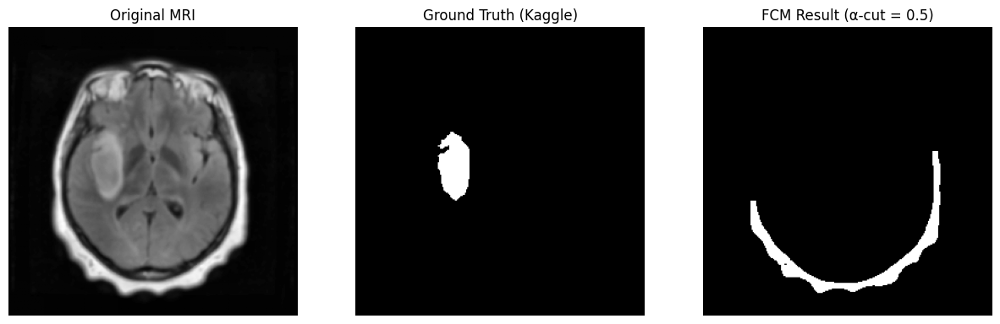

Dice Similarity Coefficient: 0.0000


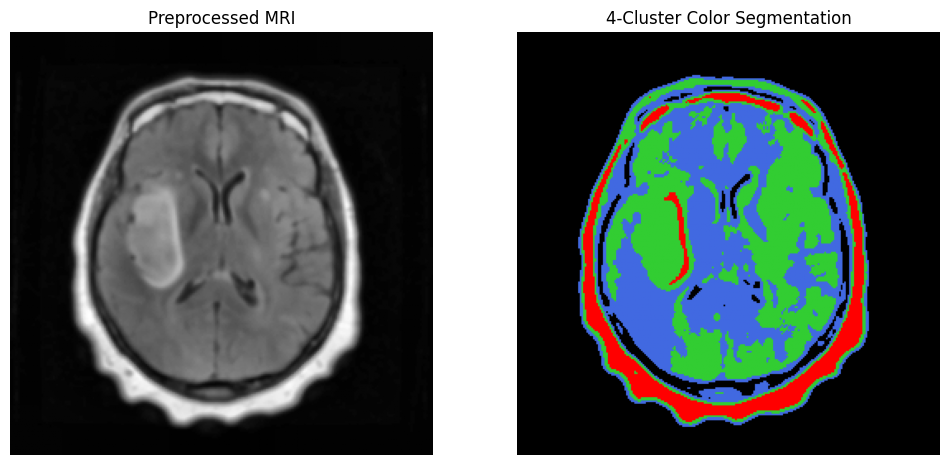

Processed: ./data\kaggle_3m\TCGA_CS_4942_19970222\TCGA_CS_4942_19970222_11.tif | Quality (FPC): 0.8684


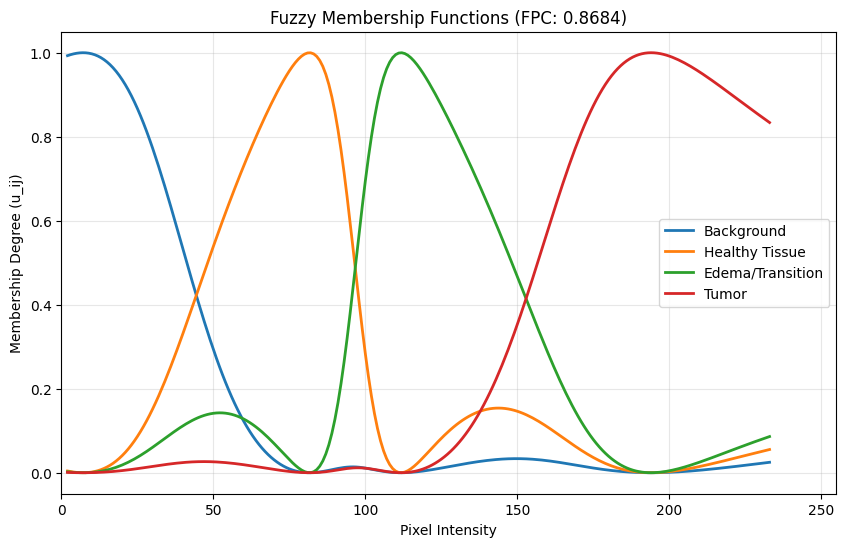

KeyboardInterrupt: 

In [135]:

results = []
dice_scores_list = []
i = 0

for img_path, mask_path in image_mask_pairs:
    
    raw_img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    
    # img_rem_skull = preprocess_and_strip_skull(raw_img)
    
    blurred = cv2.GaussianBlur(raw_img, (5, 5), 0)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    preprocessed = clahe.apply(blurred)
    
    fuzzy_tumor_set, quality_fpc, cntr, u = run_fcm_segmentation(preprocessed, n_clusters=4)
        
    results.append({
        'path': img_path,
        'fuzzy_set': fuzzy_tumor_set,
        'fpc': quality_fpc
    })
    
    # res_mask = remove_skull_by_component(preprocessed)
    cluster_indices = np.argmax(u, axis=0)
    full_seg = cluster_indices.reshape(preprocessed.shape)

    tumor_label = np.argmax(cntr)
    final_binary_mask = filter_tumor_cluster(full_seg, tumor_label=tumor_label)
    
    # test_filter_function(preprocessed, full_seg, tumor_label)
    
    # final_mask = post_process_tumor(fuzzy_tumor_set)
    
    
    dice_score = evaluate_metrics(final_binary_mask, mask)


    cleaned_full_seg = full_seg.copy()
    # If a pixel was labeled 'Tumor' but isn't in our cleaned mask, make it 'Background' (0)
    cleaned_full_seg[(full_seg == tumor_label) & (preprocessed == 0)] = 0

    dice_scores_list.append(dice_score) # Store score for averaging
    
    plot_colored_segmentation(preprocessed, cleaned_full_seg, cntr)
    
    print(f"Processed: {img_path} | Quality (FPC): {quality_fpc:.4f}")
    plot_membership_functions(preprocessed, u, cntr, quality_fpc)
    visualize_comparison(preprocessed, fuzzy_tumor_set, mask)
    print(f"Dice Similarity Coefficient: {dice_score:.4f}")


In [121]:
if len(dice_scores_list) > 0:
    average_dice = sum(dice_scores_list) / len(dice_scores_list)
    print("\n" + "="*30)
    print(f"FINAL EVALUATION RESULTS")
    print(f"Total Images Processed: {len(dice_scores_list)}")
    print(f"Average Dice Similarity Coefficient: {average_dice:.4f}")
    print("="*30)


FINAL EVALUATION RESULTS
Total Images Processed: 86
Average Dice Similarity Coefficient: 0.0468
